##3.1 Create box plots or violin plots comparing your selected metric(s) between teams from long view of data
Data is sourced from: `/content/3.2-1_all_clean_metrics_records.csv/`


In [3]:

# install.packages("ggplot2")
library(ggplot2)

# Read data from a CSV file
player_summary <- read.csv('/content/3.2-1_all_clean_metrics_records.csv')

# Display the first few rows of the data
head(player_summary)

# Display column names to help identify the correct columns for plotting
colnames(player_summary)

,X,timestamp,created_at,function_description,metric,data_source,value,team,playername
,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<chr>,<chr>
1,0,2020-12-14 12:56:23,2025-10-21 16:46:54,,leftMaxForce,vald,377.2500,Football,PLAYER_256
2,1,2020-12-14 12:56:23,2025-10-21 16:46:54,,leftTorque,vald,157.8791,Football,PLAYER_256
3,2,2020-12-14 12:56:23,2025-10-21 16:46:54,,rightMaxForce,vald,403.5000,Football,PLAYER_256
4,3,2020-12-14 12:56:23,2025-10-21 16:46:54,,rightTorque,vald,168.8647,Football,PLAYER_256
5,4,2020-12-14 12:59:59,2025-10-21 16:46:54,,leftMaxForce,vald,512.2500,Football,PLAYER_471
6,5,2020-12-14 12:59:59,2025-10-21 16:46:54,,leftTorque,vald,200.5459,Football,PLAYER_471


[1] "X"                    "timestamp"            "created_at"          
[4] "function_description" "metric"               "data_source"         
[7] "value"                "team"                 "playername"

### Box Plot for all teams

Box plots to visualizing the distribution of numerical data and detecting outliers. They show the median, quartiles, and potential outliers for each team.

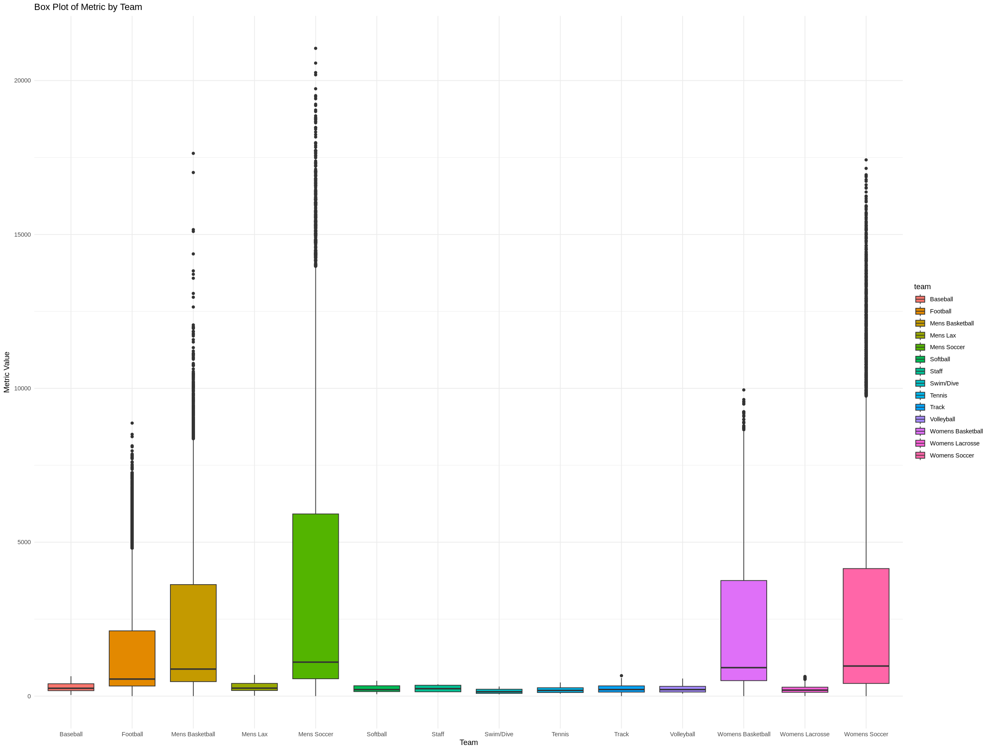

In [4]:

# Create a box plot for all teams
ggplot(player_summary, aes(x = team, y = value, fill = team)) +
  geom_boxplot() +
  labs(title = "Box Plot of Metric by Team",
       x = "Team",
       y = "Metric Value") +
  theme_minimal()

### Violin Plot for all Teams

Violin plots are similar to box plots but also show the density of the data at different values (like a smoothed histogram). This gives a richer understanding of the distribution shape.

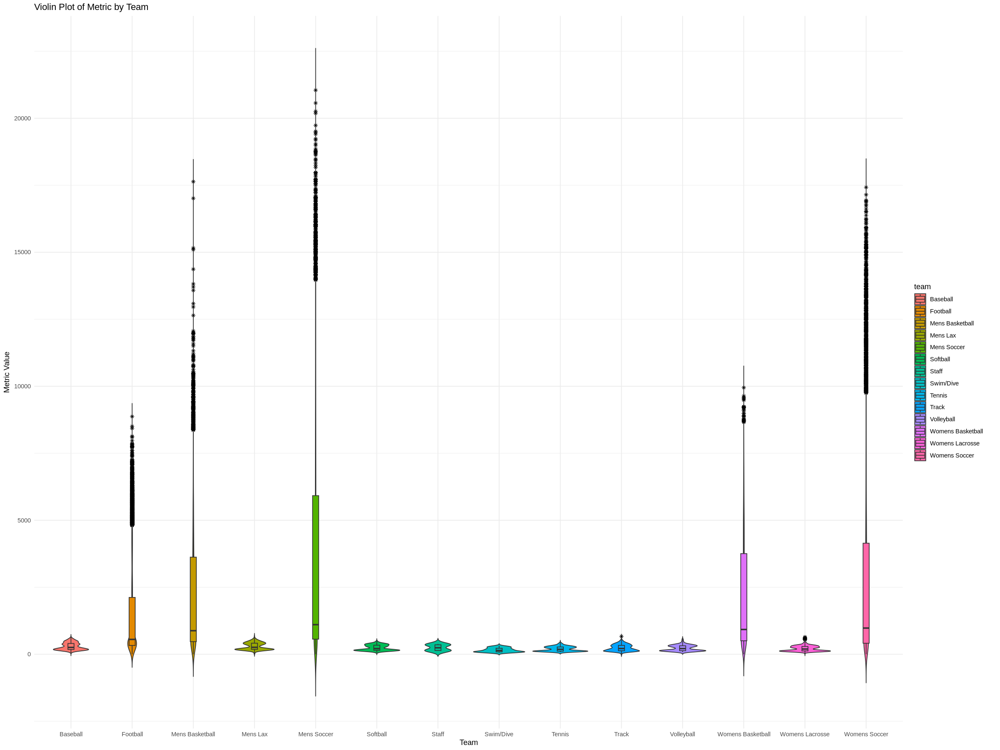

In [5]:

# Create a violin plot
ggplot(player_summary, aes(x = team, y = value, fill = team)) +
  geom_violin(trim = FALSE) + # trim = FALSE extends the violin to the min/max of the data
  geom_boxplot(width = 0.1, outlier.colour = "black", outlier.shape = 8) + # Add box plot inside for medians and quartiles
  labs(title = "Violin Plot of Metric by Team",
       x = "Team",
       y = "Metric Value") +
  theme_minimal()
  #+coord_cartesian(ylim = c(100, 500)) # Adjust these values to zoom in/out

### Selected Team metrics review (`Football`,`Basketball`, and `Soccer`)
To select only a few sport teams to focus our analysis, we filter the `player_summary` dataframe `team` column using `dplyr::filter`.
For to following selected sports teams: 'Football', 'Basketball', and "Soccer"

In [6]:
library(dplyr)

# Display unique teams in player_summary before filtering
cat("\nUnique teams in player_summary BEFORE filtering:\n")
print(unique(player_summary$team))

# Select specific teams from the player_summary dataframe
selected_teams_data <- player_summary %>%
  filter(team %in% c("Football", "Mens Basketball","Womens Basketball","Womens Soccer", "Mens Soccer"))

# Display the first few rows of the filtered data to verify
cat("\nHead of selected_teams_data:\n")
head(selected_teams_data)

# Display the unique teams in the filtered data to confirm selection
cat("\nUnique teams in selected_teams_data AFTER filtering:\n")
print(unique(selected_teams_data$team))


Unique teams in player_summary BEFORE filtering:
 [1] "Football"          "Baseball"          "Mens Basketball"  
 [4] "Womens Basketball" "Womens Soccer"     "Mens Soccer"      
 [7] "Mens Lax"          "Womens Lacrosse"   "Track"            
[10] "Tennis"            "Swim/Dive"         "Volleyball"       
[13] "Softball"          "Staff"            

Head of selected_teams_data:


,X,timestamp,created_at,function_description,metric,data_source,value,team,playername
,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<chr>,<chr>
1,0,2020-12-14 12:56:23,2025-10-21 16:46:54,,leftMaxForce,vald,377.2500,Football,PLAYER_256
2,1,2020-12-14 12:56:23,2025-10-21 16:46:54,,leftTorque,vald,157.8791,Football,PLAYER_256
3,2,2020-12-14 12:56:23,2025-10-21 16:46:54,,rightMaxForce,vald,403.5000,Football,PLAYER_256
4,3,2020-12-14 12:56:23,2025-10-21 16:46:54,,rightTorque,vald,168.8647,Football,PLAYER_256
5,4,2020-12-14 12:59:59,2025-10-21 16:46:54,,leftMaxForce,vald,512.2500,Football,PLAYER_471
6,5,2020-12-14 12:59:59,2025-10-21 16:46:54,,leftTorque,vald,200.5459,Football,PLAYER_471



Unique teams in selected_teams_data AFTER filtering:
[1] "Football"          "Mens Basketball"   "Womens Basketball"
[4] "Womens Soccer"     "Mens Soccer"      


### Box Plot for selected teams (`Football`,`Basketball`, and `Soccer`)
Box plots to focus on specific teams that has the most metric values recorded.

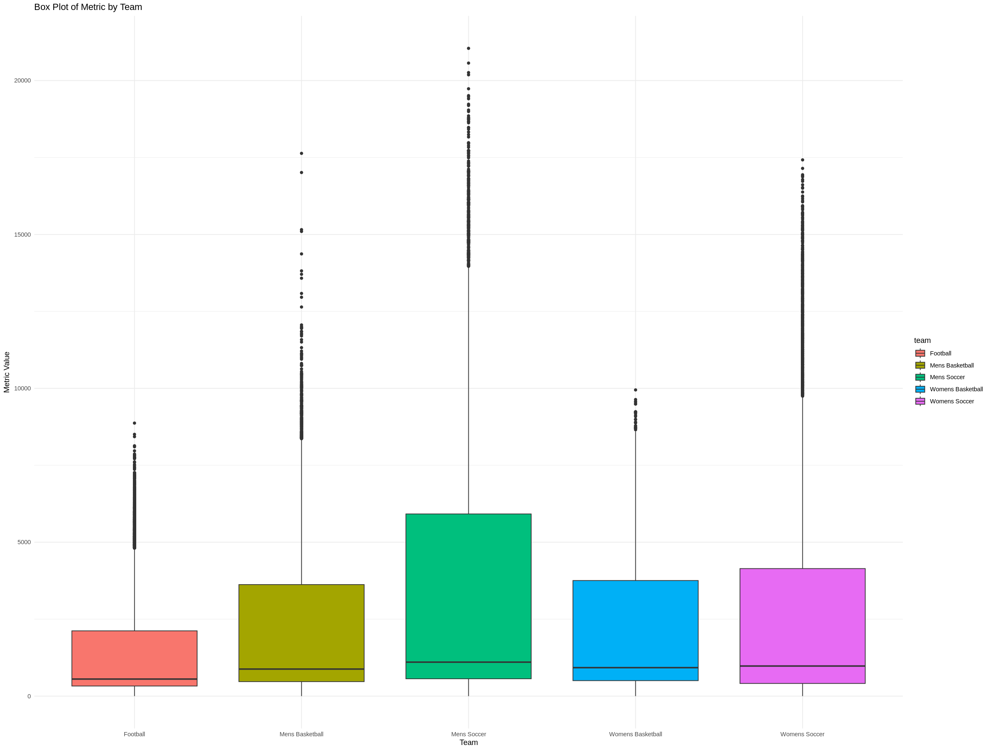

In [7]:
# Create a box plot for selected teams ("Football", "Mens Basketball","Womens Basketball","Womens Soccer", "Mens Soccer")
ggplot(selected_teams_data, aes(x = team, y = value, fill = team)) +
  geom_boxplot() +
  labs(title = "Box Plot of Metric by Team",
       x = "Team",
       y = "Metric Value") +
  theme_minimal()

## Violin Plot for selected Teams (`Football`,`Basketball`, `Soccer`)
Violin plots of selected teams to show the density of the data records.

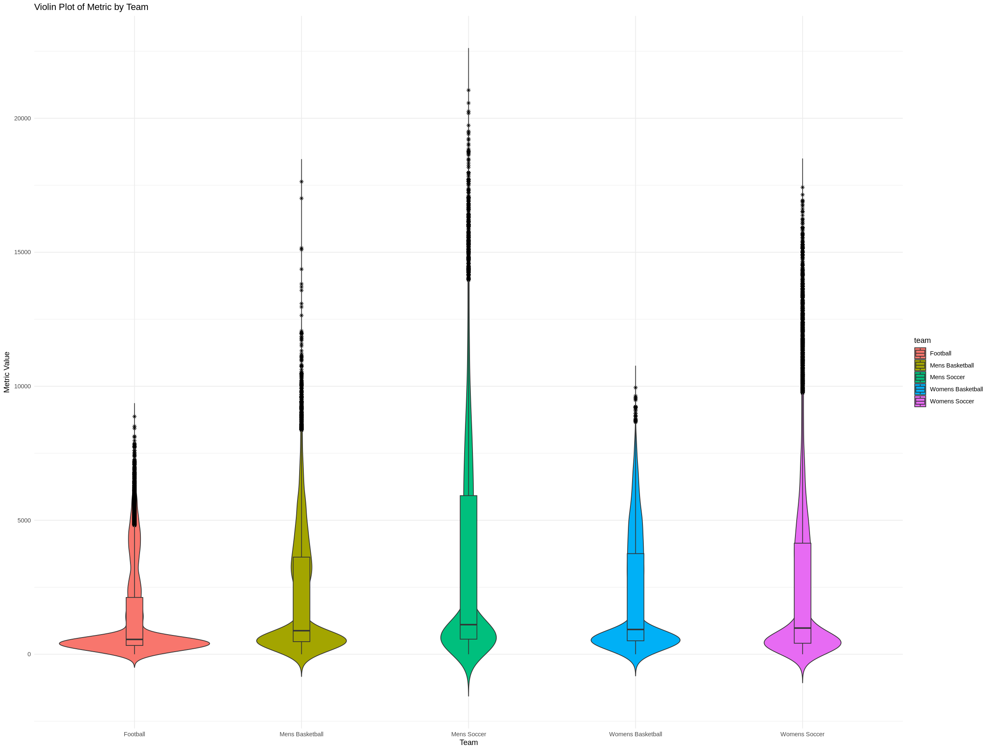

In [8]:
# Create a violin plot for selected teams ("Football", "Mens Basketball","Womens Basketball","Womens Soccer", "Mens Soccer")
ggplot(selected_teams_data, aes(x = team, y = value, fill = team)) +
  geom_violin(trim = FALSE) + # trim = FALSE extends the violin to the min/max of the data
  geom_boxplot(width = 0.1, outlier.colour = "black", outlier.shape = 8) + # Add box plot inside for medians and quartiles
  labs(title = "Violin Plot of Metric by Team",
       x = "Team",
       y = "Metric Value") +
  theme_minimal()
  #+coord_cartesian(ylim = c(100, 500)) # Adjust these values to zoom in/out

## 3.2 Calculate statistical significance (t-test or ANOVA as appropriate)

 To determine whether players with higher asymmetry differences for torque and max force results can impact acceleration load and distance total. We will need to examine the data in wide view.

Data soruced from : `/content/3.2-1_all_clean_metrics_records_wide_format.csv`

Load clean metrics in wide view

In [9]:
# Read data from a CSV file
player_summary_wide <- read.csv('/content/3.2-1_all_clean_metrics_records_wide_format.csv')


### Load dataframe with  the following fields
- team - text
- playername - text
- timestamp - datetime
- rightTorque - numerical
- leftTorque - numerical
- avg_torque_asymmetry - numerical
- rightMaxForce - numerical
- leftMaxForce - numerical
- avg_max_force_asymmetry - numerical

In [10]:
library(dplyr)

# Select specific metric columns from the player_summary dataframe (the aggregated version)
selected_metrics_data_wide <- player_summary_wide %>%
  select(team, playername, timestamp, rightTorque,leftTorque,avg_torque_asymmetry, rightMaxForce,leftMaxForce,avg_max_force_asymmetry,accel_load_accum,distance_total)

# Display the first few rows of the filtered data to verify
head(selected_metrics_data_wide)


# Display column names to help identify the correct columns for plotting
colnames(selected_metrics_data_wide)


,team,playername,timestamp,rightTorque,leftTorque,avg_torque_asymmetry,rightMaxForce,leftMaxForce,avg_max_force_asymmetry,accel_load_accum,distance_total
,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,Mens Basketball,PLAYER_002,2022-07-06 16:30:00,NA,NA,NA,NA,NA,NA,500.2222,3598.033
2,Mens Basketball,PLAYER_002,2022-07-07 16:30:00,NA,NA,NA,NA,NA,NA,374.5944,2860.270
3,Mens Basketball,PLAYER_002,2022-07-08 16:15:00,NA,NA,NA,NA,NA,NA,325.3232,2485.923
4,Mens Basketball,PLAYER_002,2022-07-11 16:30:00,NA,NA,NA,NA,NA,NA,458.0861,3504.654
5,Mens Basketball,PLAYER_002,2022-07-12 16:30:00,NA,NA,NA,NA,NA,NA,503.7700,4096.328
6,Mens Basketball,PLAYER_002,2022-07-13 16:10:00,NA,NA,NA,NA,NA,NA,426.8244,3243.928


[1] "team"                    "playername"             
 [3] "timestamp"               "rightTorque"            
 [5] "leftTorque"              "avg_torque_asymmetry"   
 [7] "rightMaxForce"           "leftMaxForce"           
 [9] "avg_max_force_asymmetry" "accel_load_accum"       
[11] "distance_total"

### Calculate Average Asymmetrical Torque from matched metrics data

Now, we will calculate the overall average of the `avg_torque_asymmetry` from the `selected_metrics_data_wide` dataframe.

In [11]:
library(dplyr)

# Calculate the average asymmetrical torque
avg_asymmetrical_torque <- mean(selected_metrics_data_wide$avg_torque_asymmetry, na.rm = TRUE)

# Display the calculated average
cat("Overall Average Asymmetrical torque:", avg_asymmetrical_torque, "\n")

Overall Average Asymmetrical torque: 1.936294 


### Calculate Average Asymmetrical Max Force from matched metrics data

And we will calculate the overall average of the `avg_max_force_asymmetry` from the `selected_metrics_data_wide` dataframe.

In [12]:
library(dplyr)

# Calculate the average asymmetrical max force
avg_asymmetrical_max_force <- mean(selected_metrics_data_wide$avg_max_force_asymmetry, na.rm = TRUE)

# Display the calculated average
cat("Overall Average Asymmetrical max force:", avg_asymmetrical_max_force, "\n")

Overall Average Asymmetrical max force: 1.960823 


### Calculate mean for the following metrics data
- `rightTorque`
- `leftTorque`
- `rightMaxForce`
- `leftMaxForce`
- `accel_load_accum`
- `distancetotal`



In [13]:
library(dplyr)

# Aggregate metrics by team, playername
# Calculate mean for torque/force metrics and sum for acceleration load and total distance
aggregated_data <-selected_metrics_data_wide %>%
  group_by(team, playername) %>%
  summarise(
    rightTorque = mean(rightTorque, na.rm = TRUE),
    leftTorque = mean(leftTorque, na.rm = TRUE),
    rightMaxForce = mean(rightMaxForce, na.rm = TRUE),
    leftMaxForce = mean(leftMaxForce, na.rm = TRUE),
    accel_load_accum = sum(accel_load_accum, na.rm = TRUE),
    distance_total = sum(distance_total, na.rm = TRUE),
    .groups = 'drop' # Drop grouping levels after summarising
  )

# Display the structure and first few rows of the aggregated data to verify
cat("\nStructure of aggregated_data:\n")
str(aggregated_data)
cat("\nHead of aggregated_data:\n")
head(aggregated_data)



Structure of aggregated_data:
tibble [814 × 8] (S3: tbl_df/tbl/data.frame)
 $ team            : chr [1:814] "Baseball" "Baseball" "Baseball" "Baseball" ...
 $ playername      : chr [1:814] "PLAYER_012" "PLAYER_018" "PLAYER_035" "PLAYER_094" ...
 $ rightTorque     : num [1:814] 225 196 228 181 156 ...
 $ leftTorque      : num [1:814] 236 210 232 208 241 ...
 $ rightMaxForce   : num [1:814] 505 422 575 399 350 ...
 $ leftMaxForce    : num [1:814] 530 452 580 460 540 ...
 $ accel_load_accum: num [1:814] 0 0 0 0 0 0 0 0 0 0 ...
 $ distance_total  : num [1:814] 0 0 0 0 0 0 0 0 0 0 ...

Head of aggregated_data:


team,playername,rightTorque,leftTorque,rightMaxForce,leftMaxForce,accel_load_accum,distance_total
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Baseball,PLAYER_012,224.8661,236.1150,504.7500,530.0000,0,0
Baseball,PLAYER_018,195.7129,209.6179,422.2500,452.2500,0,0
Baseball,PLAYER_035,228.4239,232.1409,575.1250,580.1250,0,0
Baseball,PLAYER_094,180.5033,207.8044,399.0000,459.9167,0,0
Baseball,PLAYER_1033,156.0364,240.7928,350.2500,540.5000,0,0
Baseball,PLAYER_1051,170.7131,175.3864,407.9167,419.0833,0,0


# Statistical Test
Perform linear regression tests
____________________________________
- IV = torque_asymmetry (numerical)
- IV = max_force_asymmetry (numerical)
- DV = accel_load_accum (numerical)
____________________________________
- IV = torque_asymmetry (numerical)
- IV = max_force_asymmetry (numerical)
- DV = distance_total (numerical)

Perform statistical testing on the `selected_metrics_data_wide` dataframe to compare `accel_load_accum` and `distance_total` between 'High Asymmetry' and 'Low Asymmetry' groups for both `torque_asymmetry` and `max_force_asymmetry`.
using the calcultion formula ((right - left) / (right + left)) * 100.

Generated box plots visualizes these comparisons.

Finally, summarize and interpret the findings, discussing statistical significance, insights into how asymmetry relates to performance, and acknowledging the absence of 'injury risk' data, relating the findings to sport demands.

The initial data is sourced from "/content/3.2-2_matched_metrics_by_date_wide_format.csv".

# Load Data
Load the dataset from `/content/3.2-2_matched_metrics_by_date_wide_format.csv`. Convert the 'timestamp' column to a 'date' column. Select `team`, `playername`, `date`, `rightTorque`, `leftTorque`, `rightMaxForce`, `leftMaxForce`, `accel_load_accum`, `distance_total`, `max_force_asymmetry_category`,`torque_asymmetry_category`and `distance_total`.  Then, aggregate these metrics by `team`, `playername`, and `date` by calculating the mean for `rightTorque`, `leftTorque`, `rightMaxForce`, `leftMaxForce`, and the sum for `accel_load_accum` and `distance_total`.

In [14]:
# install.packages("ggplot2")
library(ggplot2)

# Read data from a CSV file
matched_wide <- read.csv('/content/3.2-2_matched_metrics_by_date_wide_format.csv')

# Display the first few rows of the data
head(matched_wide)

# Display column names to help identify the correct columns for plotting
colnames(matched_wide)

,test_date,test_timestamp,playername,team,leftMaxForce,rightMaxForce,avg_max_force_asymmetry,leftTorque,rightTorque,avg_torque_asymmetry,accel_load_accum,distance_total,accel_distance_test_date,accel_distance_timestamp
,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
1,2022-03-28,2022-03-28 17:50:46,PLAYER_1114,Mens Soccer,364.00,360.50,0.4830918,155.6100,154.1138,0.4830918,901.4337,7487.269,2022-03-28,2022-03-28 15:00:01
2,2022-03-28,2022-03-28 17:46:53,PLAYER_1191,Mens Soccer,399.50,390.75,1.1072445,152.8088,149.4619,1.1072445,989.7393,7667.277,2022-03-28,2022-03-28 15:00:01
3,2022-03-28,2022-03-28 17:42:59,PLAYER_137,Mens Soccer,334.75,342.50,-1.1443337,146.1184,149.5012,-1.1443337,1186.6635,9503.898,2022-03-28,2022-03-28 15:00:01
4,2022-04-18,2022-04-18 17:46:59,PLAYER_1114,Mens Soccer,388.75,364.00,3.2879442,166.1906,155.6100,3.2879442,929.7303,8413.833,2022-04-18,2022-04-18 15:00:00
5,2022-04-18,2022-04-18 17:45:07,PLAYER_1191,Mens Soccer,380.75,343.25,5.1795580,145.6369,131.2931,5.1795580,1051.0362,8082.926,2022-04-18,2022-04-18 15:00:00
6,2022-04-18,2022-04-18 17:37:14,PLAYER_137,Mens Soccer,381.50,392.00,-1.3574661,166.5248,171.1080,-1.3574661,1484.1813,10297.781,2022-04-18,2022-04-18 15:00:00


[1] "test_date"                "test_timestamp"          
 [3] "playername"               "team"                    
 [5] "leftMaxForce"             "rightMaxForce"           
 [7] "avg_max_force_asymmetry"  "leftTorque"              
 [9] "rightTorque"              "avg_torque_asymmetry"    
[11] "accel_load_accum"         "distance_total"          
[13] "accel_distance_test_date" "accel_distance_timestamp"

**Categorization**:
Create categorize for `torque_asymmetry` and `max_force_asymmetry` scores into 'High Asymmetry' and 'Low Asymmetry' based on a defined threshold of +/- 10% to classify asymmetry.

Generate new categorical columns `torque_asymmetry_category` and `max_force_asymmetry_category` in the `matched_wide` DataFrame.


Original data sourced from `/conent/3.2-2_matched_metrics_by_date_wide_format.csv`



In [15]:
library(dplyr)

# Define a threshold for asymmetry (e.g., +/- 10%)
asymmetry_threshold <- 10

# Categorize torque asymmetry
matched_merged_data <- matched_wide %>%
  mutate(torque_asymmetry_category = case_when(
    abs(avg_torque_asymmetry) > asymmetry_threshold ~ "High Asymmetry",
    abs(avg_torque_asymmetry) <= asymmetry_threshold ~ "Low Asymmetry",
    TRUE ~ NA_character_ # Handle NA values
  ))
  # Display the first few rows with the new categories to verify
  head(matched_merged_data)

# Display the distribution of categories for verification
print(table(matched_merged_data$torque_asymmetry_category))


,test_date,test_timestamp,playername,team,leftMaxForce,rightMaxForce,avg_max_force_asymmetry,leftTorque,rightTorque,avg_torque_asymmetry,accel_load_accum,distance_total,accel_distance_test_date,accel_distance_timestamp,torque_asymmetry_category
,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>
1,2022-03-28,2022-03-28 17:50:46,PLAYER_1114,Mens Soccer,364.00,360.50,0.4830918,155.6100,154.1138,0.4830918,901.4337,7487.269,2022-03-28,2022-03-28 15:00:01,Low Asymmetry
2,2022-03-28,2022-03-28 17:46:53,PLAYER_1191,Mens Soccer,399.50,390.75,1.1072445,152.8088,149.4619,1.1072445,989.7393,7667.277,2022-03-28,2022-03-28 15:00:01,Low Asymmetry
3,2022-03-28,2022-03-28 17:42:59,PLAYER_137,Mens Soccer,334.75,342.50,-1.1443337,146.1184,149.5012,-1.1443337,1186.6635,9503.898,2022-03-28,2022-03-28 15:00:01,Low Asymmetry
4,2022-04-18,2022-04-18 17:46:59,PLAYER_1114,Mens Soccer,388.75,364.00,3.2879442,166.1906,155.6100,3.2879442,929.7303,8413.833,2022-04-18,2022-04-18 15:00:00,Low Asymmetry
5,2022-04-18,2022-04-18 17:45:07,PLAYER_1191,Mens Soccer,380.75,343.25,5.1795580,145.6369,131.2931,5.1795580,1051.0362,8082.926,2022-04-18,2022-04-18 15:00:00,Low Asymmetry
6,2022-04-18,2022-04-18 17:37:14,PLAYER_137,Mens Soccer,381.50,392.00,-1.3574661,166.5248,171.1080,-1.3574661,1484.1813,10297.781,2022-04-18,2022-04-18 15:00:00,Low Asymmetry



High Asymmetry  Low Asymmetry 
            51            327 


### Visualization of Torque Asymmetry Category in relation to Accel Load Accum

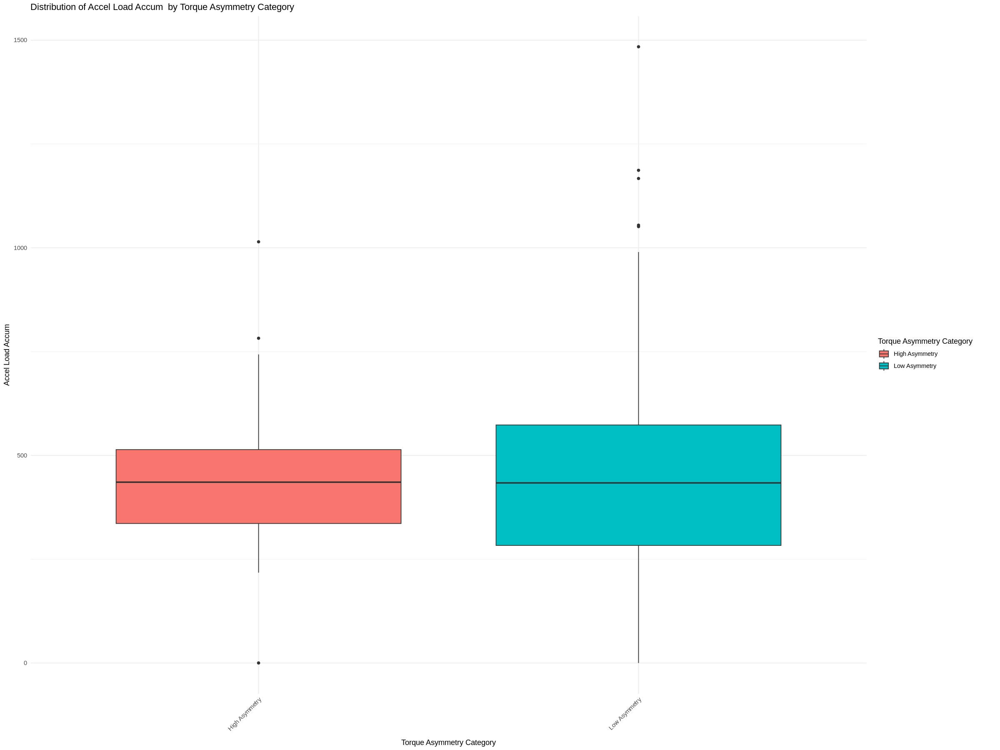

In [16]:
library(ggplot2)
library(dplyr)

# Remove rows with NA in either category for plotting
plot_data <- matched_merged_data %>%
  filter(!is.na(accel_load_accum) & !is.na(torque_asymmetry_category))

# Create a box plot to visualize the distribution of Accel Load Accum by Max Force Asymmetry Category
print(ggplot(plot_data, aes(x = torque_asymmetry_category, y = accel_load_accum, fill = torque_asymmetry_category)) +
  geom_boxplot() +
  labs(title = "Distribution of Accel Load Accum  by Torque Asymmetry Category",
       x = "Torque Asymmetry Category",
       y = "Accel Load Accum",
       fill = "Torque Asymmetry Category") +
  theme_minimal() +
  theme(axis.text.x = element_text(angle = 45, hjust = 1)))


### Visualization of Torque Asymmetry Category in relation to Distance Total

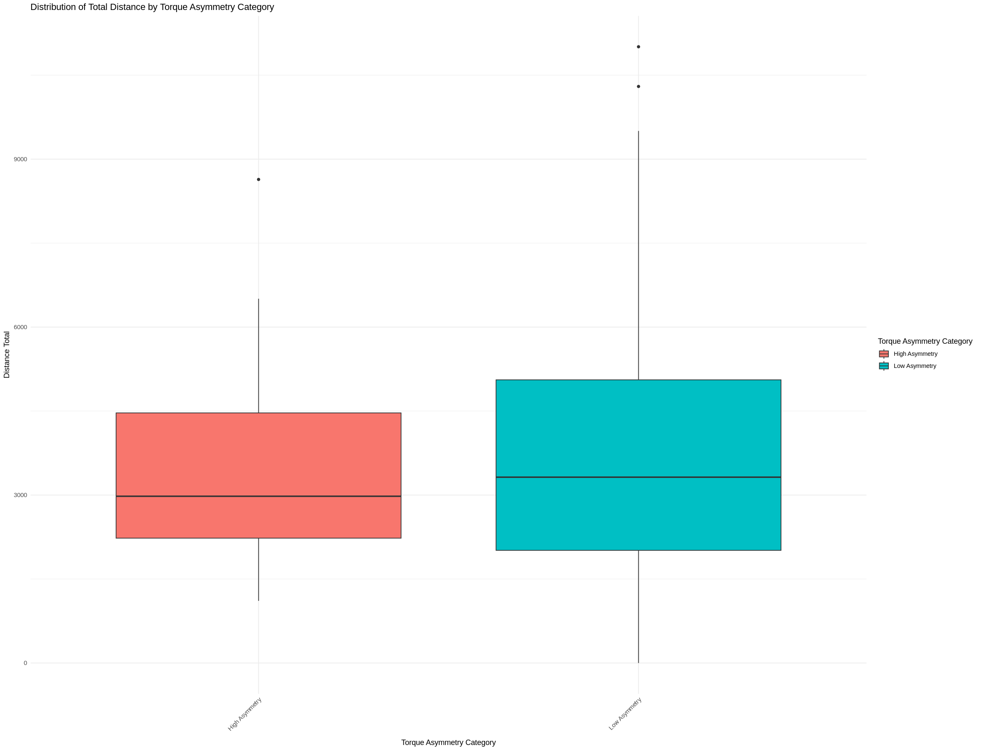

In [17]:
library(ggplot2)
library(dplyr)

# Remove rows with NA in either category for plotting
plot_data <- matched_merged_data %>%
  filter(!is.na(distance_total) & !is.na(torque_asymmetry_category))

# Create a box plot to visualize the distribution of Accel Load Accum by Max Force Asymmetry Category
print(ggplot(plot_data, aes(x = torque_asymmetry_category, y = distance_total, fill = torque_asymmetry_category)) +
  geom_boxplot() +
  labs(title = "Distribution of Total Distance by Torque Asymmetry Category",
       x = "Torque Asymmetry Category",
       y = "Distance Total",
       fill = "Torque Asymmetry Category") +
  theme_minimal() +
  theme(axis.text.x = element_text(angle = 45, hjust = 1)))


#### Perform T-test for Torque Asymmetry Category vs. Accel Load

Conduct a T-test analysis to model the relationship between `torque_asymmetry_category` (as a category) and `accel_load_accum` using the `matched_merged_data`.

- P-Value = 0.8672 - weak statistical significance greater than 0.05


In [18]:
library(dplyr)

# Filter out NA values from the category before performing t-test if this is run individually
filtered_data <- matched_merged_data %>% filter(!is.na(torque_asymmetry_category))

# 1. Perform a T-test using the categorical variable
model_torque_accel_ttest <- t.test(accel_load_accum ~ torque_asymmetry_category, data = filtered_data)

# 2. Print the summary of the model
cat("\nT-test Summary for Accel Load Accum vs. Torque Asymmetry Category:\n")
print(model_torque_accel_ttest)


T-test Summary for Accel Load Accum vs. Torque Asymmetry Category:

	Welch Two Sample t-test

data:  accel_load_accum by torque_asymmetry_category
t = -0.16773, df = 85.564, p-value = 0.8672
alternative hypothesis: true difference in means between group High Asymmetry and group Low Asymmetry is not equal to 0
95 percent confidence interval:
 -59.08347  49.88965
sample estimates:
mean in group High Asymmetry  mean in group Low Asymmetry 
                    440.0934                     444.6903 



#### Perform T-test for Torque Asymmetry Category vs. Distance Total

Conduct a T-test analysis to model the relationship between `torque_asymmetry_category` (as a category) and `distance_total` using the `matched_merged_data`.

- DV = distance_total
- IV = torque_asymetry_category

- P-Value = 0.3264 - very weak statistical significance greater than 0.05


In [19]:
library(dplyr)

# Filter out NA values from the category before performing t-test if this is run individually
filtered_data <- matched_merged_data %>% filter(!is.na(torque_asymmetry_category))

# 1. Perform a T-test using the categorical variable
model_torque_distance_ttest <- t.test(distance_total ~ torque_asymmetry_category, data = filtered_data)

# 2. Print the summary of the model
cat("\nT-test Summary for Distance Total vs. Torque Asymmetry Category:\n")
print(model_torque_distance_ttest)


T-test Summary for Distance Total vs. Torque Asymmetry Category:

	Welch Two Sample t-test

data:  distance_total by torque_asymmetry_category
t = -0.98729, df = 83.129, p-value = 0.3264
alternative hypothesis: true difference in means between group High Asymmetry and group Low Asymmetry is not equal to 0
95 percent confidence interval:
 -745.3904  250.8578
sample estimates:
mean in group High Asymmetry  mean in group Low Asymmetry 
                    3453.580                     3700.846 



In [20]:
library(dplyr)

# Define a threshold for asymmetry (e.g., +/- 10%)
asymmetry_threshold <- 10

# Categorize max force asymmetry
matched_merged_data <- matched_wide %>%
  mutate(max_force_asymmetry_category = case_when(
    abs(avg_max_force_asymmetry) > asymmetry_threshold ~ "High Asymmetry",
    abs(avg_max_force_asymmetry) <= asymmetry_threshold ~ "Low Asymmetry",
    TRUE ~ NA_character_ # Handle NA values
  ))

# Display the first few rows with the new categories to verify
head(matched_merged_data)

# Display the distribution of categories for verification
print(table(matched_merged_data$max_force_asymmetry_category))

,test_date,test_timestamp,playername,team,leftMaxForce,rightMaxForce,avg_max_force_asymmetry,leftTorque,rightTorque,avg_torque_asymmetry,accel_load_accum,distance_total,accel_distance_test_date,accel_distance_timestamp,max_force_asymmetry_category
,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>
1,2022-03-28,2022-03-28 17:50:46,PLAYER_1114,Mens Soccer,364.00,360.50,0.4830918,155.6100,154.1138,0.4830918,901.4337,7487.269,2022-03-28,2022-03-28 15:00:01,Low Asymmetry
2,2022-03-28,2022-03-28 17:46:53,PLAYER_1191,Mens Soccer,399.50,390.75,1.1072445,152.8088,149.4619,1.1072445,989.7393,7667.277,2022-03-28,2022-03-28 15:00:01,Low Asymmetry
3,2022-03-28,2022-03-28 17:42:59,PLAYER_137,Mens Soccer,334.75,342.50,-1.1443337,146.1184,149.5012,-1.1443337,1186.6635,9503.898,2022-03-28,2022-03-28 15:00:01,Low Asymmetry
4,2022-04-18,2022-04-18 17:46:59,PLAYER_1114,Mens Soccer,388.75,364.00,3.2879442,166.1906,155.6100,3.2879442,929.7303,8413.833,2022-04-18,2022-04-18 15:00:00,Low Asymmetry
5,2022-04-18,2022-04-18 17:45:07,PLAYER_1191,Mens Soccer,380.75,343.25,5.1795580,145.6369,131.2931,5.1795580,1051.0362,8082.926,2022-04-18,2022-04-18 15:00:00,Low Asymmetry
6,2022-04-18,2022-04-18 17:37:14,PLAYER_137,Mens Soccer,381.50,392.00,-1.3574661,166.5248,171.1080,-1.3574661,1484.1813,10297.781,2022-04-18,2022-04-18 15:00:00,Low Asymmetry



High Asymmetry  Low Asymmetry 
            51            332 


#### Perform T-test for Max Force Asymmetry Category vs. Accel Load

Conduct a T-test regression analysis to model the relationship between `max_force_asymmetry_category` (as a category) and `accel_load_accum` using the `matched_merged_data`.

- P-Value = 0.9979 - very weak statistical significance greater than 0.05


In [21]:
library(dplyr)

# Filter out NA values from the category before performing t-test if this is run individually
filtered_data <- matched_merged_data %>% filter(!is.na(max_force_asymmetry_category))

# 1. Perform a T-test using the categorical variable
model_max_force_accel_ttest <- t.test(accel_load_accum ~ max_force_asymmetry_category, data = filtered_data)

# 2. Print the summary of the model
cat("\nT-test Summary for Accel Load Accum vs. Max Force Asymmetry Category:\n")
print(model_max_force_accel_ttest)


T-test Summary for Accel Load Accum vs. Max Force Asymmetry Category:

	Welch Two Sample t-test

data:  accel_load_accum by max_force_asymmetry_category
t = -0.0025884, df = 85.407, p-value = 0.9979
alternative hypothesis: true difference in means between group High Asymmetry and group Low Asymmetry is not equal to 0
95 percent confidence interval:
 -54.52889  54.38709
sample estimates:
mean in group High Asymmetry  mean in group Low Asymmetry 
                    440.0934                     440.1643 



In [22]:
library(dplyr)

# Filter out NA values from the category before performing t-test if this is run individually
filtered_data <- matched_merged_data %>% filter(!is.na(max_force_asymmetry_category))

# 1. Perform a T-test using the categorical variable
model_max_force_distance_ttest <- t.test(distance_total ~ max_force_asymmetry_category, data = filtered_data)

# 2. Print the summary of the model
cat("\nT-test Summary for Distance Total vs. Max Force Asymmetry Category:\n")
print(model_max_force_distance_ttest)


T-test Summary for Distance Total vs. Max Force Asymmetry Category:

	Welch Two Sample t-test

data:  distance_total by max_force_asymmetry_category
t = -0.81014, df = 83.024, p-value = 0.4202
alternative hypothesis: true difference in means between group High Asymmetry and group Low Asymmetry is not equal to 0
95 percent confidence interval:
 -700.7515  295.1158
sample estimates:
mean in group High Asymmetry  mean in group Low Asymmetry 
                    3453.580                     3656.398 



### Visualization of Max Force Asymmetry Category in relation to Accel Load Accum

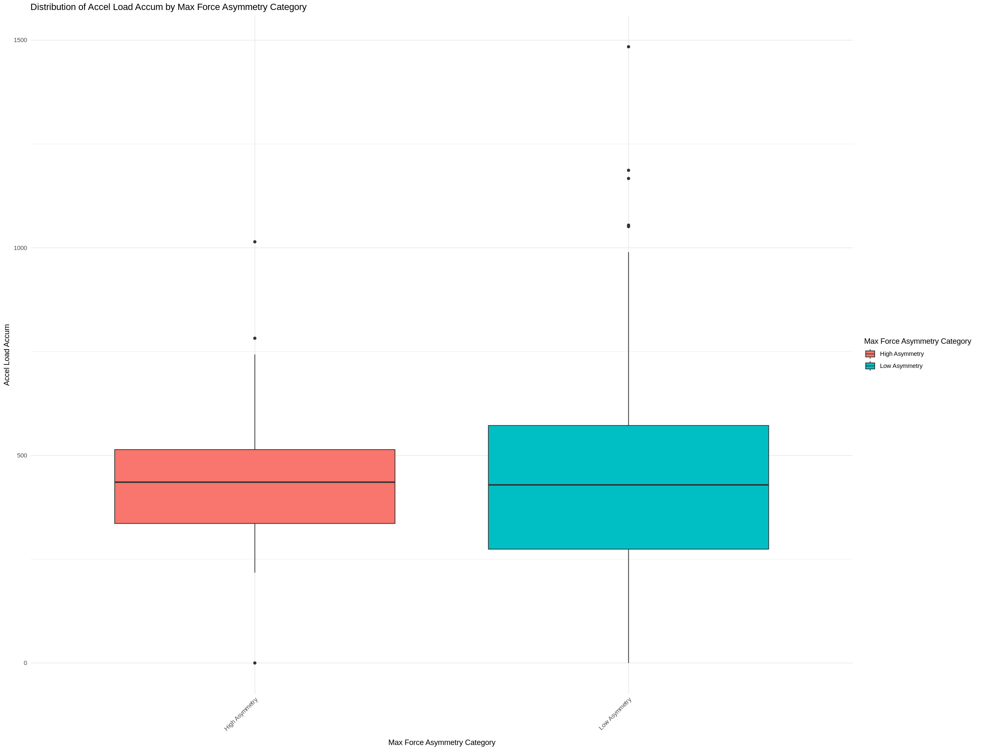

In [23]:
library(ggplot2)
library(dplyr)

# Remove rows with NA in either category for plotting
plot_data <- matched_merged_data %>%
  filter(!is.na(accel_load_accum) & !is.na(max_force_asymmetry_category))

# Create a box plot to visualize the distribution of Accel Load Accum by Max Force Asymmetry Category
print(ggplot(plot_data, aes(x = max_force_asymmetry_category, y = accel_load_accum, fill = max_force_asymmetry_category)) +
  geom_boxplot() +
  labs(title = "Distribution of Accel Load Accum by Max Force Asymmetry Category",
       x = "Max Force Asymmetry Category",
       y = "Accel Load Accum",
       fill = "Max Force Asymmetry Category") +
  theme_minimal() +
  theme(axis.text.x = element_text(angle = 45, hjust = 1)))


### Visualization of Max Force in relation to Distance Total

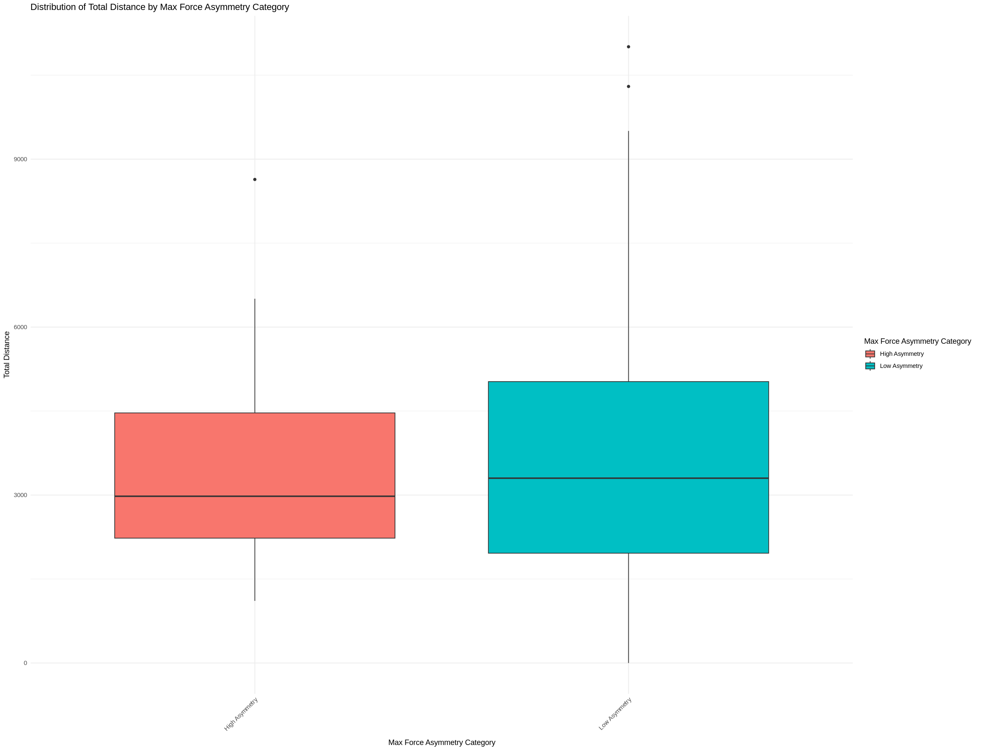

In [24]:
library(ggplot2)
library(dplyr)

# Remove rows with NA in either category for plotting
plot_data <- matched_merged_data %>%
  filter(!is.na(distance_total) & !is.na(max_force_asymmetry_category))

# Create a box plot to visualize the distribution of Total Distance by Max Force Asymmetry Category
print(ggplot(plot_data, aes(x = max_force_asymmetry_category, y = distance_total, fill = max_force_asymmetry_category)) +
  geom_boxplot() +
  labs(title = "Distribution of Total Distance by Max Force Asymmetry Category",
       x = "Max Force Asymmetry Category",
       y = "Total Distance",
       fill = "Max Force Asymmetry Category") +
  theme_minimal() +
  theme(axis.text.x = element_text(angle = 45, hjust = 1)))


#### Perform Linear Regression for Avg Torque Asymmetry vs. Accel Load

Conduct a linear regression analysis to model the relationship between `torque_asymmetry` (as a continuous variable) and `accel_load_accum` using the `matched_merged_data`.

- P-Value = 0.0404 - mild statistical significance less than 0.05
- R-square = 0.008872 - weak coorelation lower than 0.3


In [25]:
library(dplyr)

# 1. Perform a linear regression
model_torque_accel <- lm(accel_load_accum ~ avg_torque_asymmetry, data = matched_merged_data)

# 2. Print the summary of the model
cat("\nLinear Regression Summary for Accel Load Accum vs. Avg Torque Asymmetry:\n")
summary(model_torque_accel)


Linear Regression Summary for Accel Load Accum vs. Avg Torque Asymmetry:



Call:
lm(formula = accel_load_accum ~ avg_torque_asymmetry, data = matched_merged_data)

Residuals:
    Min      1Q  Median      3Q     Max 
-469.89 -156.55   -9.66  116.48 1030.90 

Coefficients:
                     Estimate Std. Error t value Pr(>|t|)    
(Intercept)           449.850     12.609  35.676   <2e-16 ***
avg_torque_asymmetry   -2.525      1.616  -1.562    0.119    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 234.4 on 376 degrees of freedom
  (5 observations deleted due to missingness)
Multiple R-squared:  0.006448,	Adjusted R-squared:  0.003805 
F-statistic:  2.44 on 1 and 376 DF,  p-value: 0.1191


#### Perform Linear Regression for Avg Torque Asymmetry vs. Distance Total

Conduct a linear regression analysis to model the relationship between `torque_asymmetry` (as a continuous variable) and `distance_total` using the `matched_merged_data`.

- P-Value = 0.0404 - mild statistical significance less than 0.05
- R-square = 0.008872 - weak coorelation lower than 0.3

In [26]:
library(dplyr)

# 1. Perform a linear regression for avg_torque_asymmetry vs. distance_total
model_torque_distance <- lm(distance_total ~ avg_torque_asymmetry, data = matched_merged_data)

# 2. Print the summary of the model
cat("\nLinear Regression Summary for Distance Total vs. Avg Torque Asymmetry:\n")
summary(model_torque_distance)


Linear Regression Summary for Distance Total vs. Avg Torque Asymmetry:



Call:
lm(formula = distance_total ~ avg_torque_asymmetry, data = matched_merged_data)

Residuals:
    Min      1Q  Median      3Q     Max 
-4211.4 -1583.6  -277.5  1289.4  7226.6 

Coefficients:
                     Estimate Std. Error t value Pr(>|t|)    
(Intercept)           3734.78     113.99  32.764   <2e-16 ***
avg_torque_asymmetry   -29.73      14.45  -2.057   0.0404 *  
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 2075 on 360 degrees of freedom
  (21 observations deleted due to missingness)
Multiple R-squared:  0.01162,	Adjusted R-squared:  0.008872 
F-statistic: 4.231 on 1 and 360 DF,  p-value: 0.0404


#### Perform Linear Regression for Avg Max Force Asymmetry vs. Accel Load

Conduct a linear regression analysis to model the relationship between `avg_max_force_asymmetry` (as a continuous variable) and `accel_load_accum` using the `matched_merged_data`.

- P-Value = 0.05434 - weak statistical significance greater than 0.05
- R-square = 0.007393  - weak coorelation lower than 0.3

In [27]:
library(dplyr)

# 1. Perform a linear regression for avg_max_force_asymmetry vs. accel_load_accum
model_max_accel <- lm(distance_total ~ avg_max_force_asymmetry, data = matched_merged_data)

# 2. Print the summary of the model
cat("\nLinear Regression Summary for Accel Load Accum vs. Avg Max Force Asymmetry:\n")
summary(model_max_accel)


Linear Regression Summary for Accel Load Accum vs. Avg Max Force Asymmetry:



Call:
lm(formula = distance_total ~ avg_max_force_asymmetry, data = matched_merged_data)

Residuals:
   Min     1Q Median     3Q    Max 
 -4031  -1608   -274   1297   7272 

Coefficients:
                        Estimate Std. Error t value Pr(>|t|)    
(Intercept)              3692.36     113.94   32.41   <2e-16 ***
avg_max_force_asymmetry   -28.02      14.52   -1.93   0.0543 .  
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 2089 on 365 degrees of freedom
  (16 observations deleted due to missingness)
Multiple R-squared:  0.01011,	Adjusted R-squared:  0.007393 
F-statistic: 3.726 on 1 and 365 DF,  p-value: 0.05434


#### Perform Linear Regression for Avg Max Force Asymmetry vs. Distance Total

Conduct a linear regression analysis to model the relationship between `avg_max_force_asymmetry` (as a continuous variable) and `distance_total` using the `matched_merged_data`.

- P-Value = 0.05434 - weak statistical significance greater than 0.05
- R-square = 0.007393  - weak coorelation lower than 0.3

In [28]:
library(dplyr)

# 1. Perform a linear regression for avg_max_force_asymmetry vs. distance_total
model_max_force_distance <- lm(distance_total ~ avg_max_force_asymmetry, data = matched_merged_data)

# 2. Print the summary of the model
cat("\nLinear Regression Summary for Distance Total vs. Avg Max Force Asymmetry:\n")
summary(model_max_force_distance)


Linear Regression Summary for Distance Total vs. Avg Max Force Asymmetry:



Call:
lm(formula = distance_total ~ avg_max_force_asymmetry, data = matched_merged_data)

Residuals:
   Min     1Q Median     3Q    Max 
 -4031  -1608   -274   1297   7272 

Coefficients:
                        Estimate Std. Error t value Pr(>|t|)    
(Intercept)              3692.36     113.94   32.41   <2e-16 ***
avg_max_force_asymmetry   -28.02      14.52   -1.93   0.0543 .  
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 2089 on 365 degrees of freedom
  (16 observations deleted due to missingness)
Multiple R-squared:  0.01011,	Adjusted R-squared:  0.007393 
F-statistic: 3.726 on 1 and 365 DF,  p-value: 0.05434


#3.3 Create a visualization showing testing frequency by team over time

## Load Data and Prepare Dates
Load the dataset from `/content/3.2-1_all_clean_metrics_records_wide_format.csv` and convert the 'timestamp' column to a proper date format, suitable for time-series analysis.


In [29]:
library(dplyr)
library(lubridate) # Load the lubridate package for robust date parsing

# Load the dataset, explicitly preventing automatic date parsing for 'timestamp'
# by specifying its colClasses as "character". This ensures we work with raw strings.
all_col_names <- colnames(read.csv('/content/3.2-1_all_clean_metrics_records_wide_format.csv', nrows=1))
col_classes_vector <- rep(NA_character_, length(all_col_names))
names(col_classes_vector) <- all_col_names
col_classes_vector["test_date"] <- "character"

matched_wide <- read.csv('/content/3.2-1_all_clean_metrics_records_wide_format.csv', colClasses = col_classes_vector)

# Inspect the raw character values of 'test_date' to confirm its format
cat("Raw character values of 'test_date' before conversion:\n")
print(head(matched_wide$timestamp, 10))

# Convert 'test_date' to a Date object.
# Based on the formats seen in 'test_date' and 'accel_distance_timestamp' (e.g., "3/28/2022", "3/28/2022 15:00"),
# we use 'mdy HMS', 'mdy HM', and 'mdy' as robust orders for parsing.
matched_wide$timestamp <- as.Date(parse_date_time(matched_wide$timestamp,
                                               orders = c("mdy HMS", "mdy HM", "mdy")))

# Display the structure of the updated dataframe to verify the conversion
str(matched_wide)

# Display the first few rows to confirm the date format
head(matched_wide)

# Check for NA values in the converted test_timestamp column
cat("Number of NA dates in test_timestamp after conversion:", sum(is.na(matched_wide$timestamp)), "\n")

Warning message in read.table(file = file, header = header, sep = sep, quote = quote, :
“not all columns named in 'colClasses' exist”


Raw character values of 'test_date' before conversion:
 [1] "2022-07-06 16:30:00" "2022-07-07 16:30:00" "2022-07-08 16:15:00"
 [4] "2022-07-11 16:30:00" "2022-07-12 16:30:00" "2022-07-13 16:10:00"
 [7] "2022-07-14 16:25:00" "2022-07-19 11:00:30" "2022-07-20 17:00:38"
[10] "2022-07-21 11:00:00"


Warning message:
“All formats failed to parse. No formats found.”


'data.frame':	44314 obs. of  13 variables:
 $ X                      : int  0 1 2 3 4 5 6 7 8 9 ...
 $ playername             : chr  "PLAYER_002" "PLAYER_002" "PLAYER_002" "PLAYER_002" ...
 $ timestamp              : Date, format: NA NA ...
 $ team                   : chr  "Mens Basketball" "Mens Basketball" "Mens Basketball" "Mens Basketball" ...
 $ data_source            : chr  "kinexon" "kinexon" "kinexon" "kinexon" ...
 $ accel_load_accum       : num  500 375 325 458 504 ...
 $ distance_total         : num  3598 2860 2486 3505 4096 ...
 $ leftMaxForce           : num  NA NA NA NA NA NA NA NA NA NA ...
 $ leftTorque             : num  NA NA NA NA NA NA NA NA NA NA ...
 $ rightMaxForce          : num  NA NA NA NA NA NA NA NA NA NA ...
 $ rightTorque            : num  NA NA NA NA NA NA NA NA NA NA ...
 $ avg_torque_asymmetry   : num  NA NA NA NA NA NA NA NA NA NA ...
 $ avg_max_force_asymmetry: num  NA NA NA NA NA NA NA NA NA NA ...


,X,playername,timestamp,team,data_source,accel_load_accum,distance_total,leftMaxForce,leftTorque,rightMaxForce,rightTorque,avg_torque_asymmetry,avg_max_force_asymmetry
,<int>,<chr>,<date>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,0,PLAYER_002,NA,Mens Basketball,kinexon,500.2222,3598.033,NA,NA,NA,NA,NA,NA
2,1,PLAYER_002,NA,Mens Basketball,kinexon,374.5944,2860.270,NA,NA,NA,NA,NA,NA
3,2,PLAYER_002,NA,Mens Basketball,kinexon,325.3232,2485.923,NA,NA,NA,NA,NA,NA
4,3,PLAYER_002,NA,Mens Basketball,kinexon,458.0861,3504.654,NA,NA,NA,NA,NA,NA
5,4,PLAYER_002,NA,Mens Basketball,kinexon,503.7700,4096.328,NA,NA,NA,NA,NA,NA
6,5,PLAYER_002,NA,Mens Basketball,kinexon,426.8244,3243.928,NA,NA,NA,NA,NA,NA


Number of NA dates in test_timestamp after conversion: 44314 



## Create a line plot to visualize testing frequency by team over time for  `All Selected Metrics` for `Football`,`Soccer`, and `Basketball` sport teams.

### Test Frequency across all selected teams and metrics
 - Sports - `Football`,`Soccer`,`Basketball`
 - Teams - `Football`,`Mens Soccer`,`Womens Soccer`, `Mens Basket Ball`, `Womens Basketball`
 - Metrics - `leftMaxForce`, `rightMaxForce`, `leftTorque`, `rightTorque`, `accel_load_accum`, `distance_total`

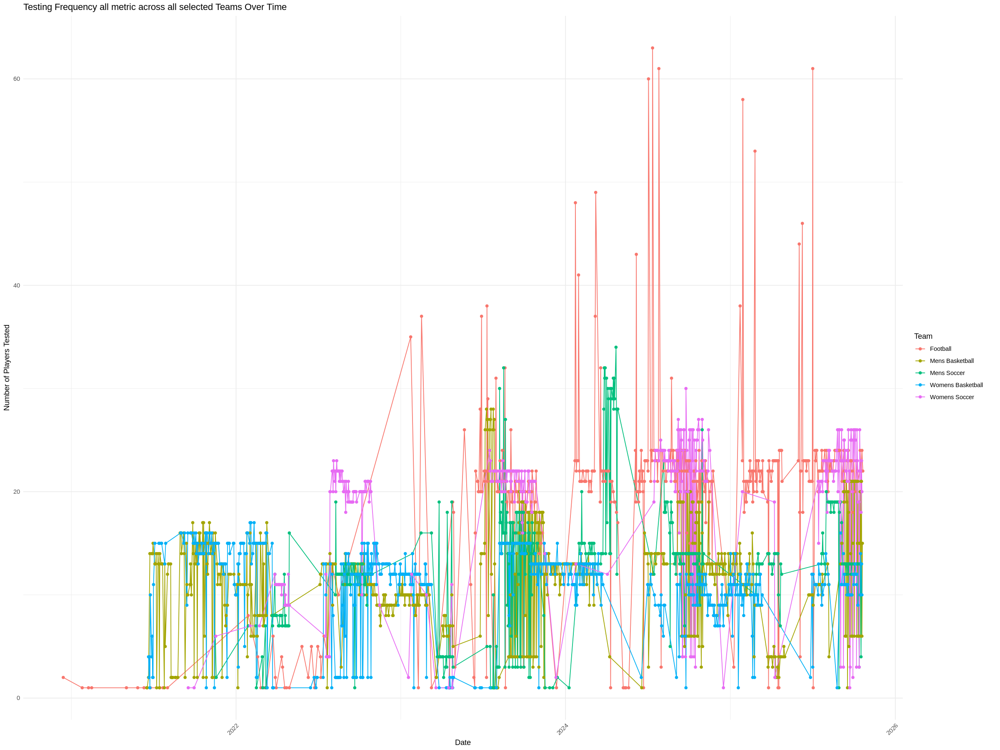

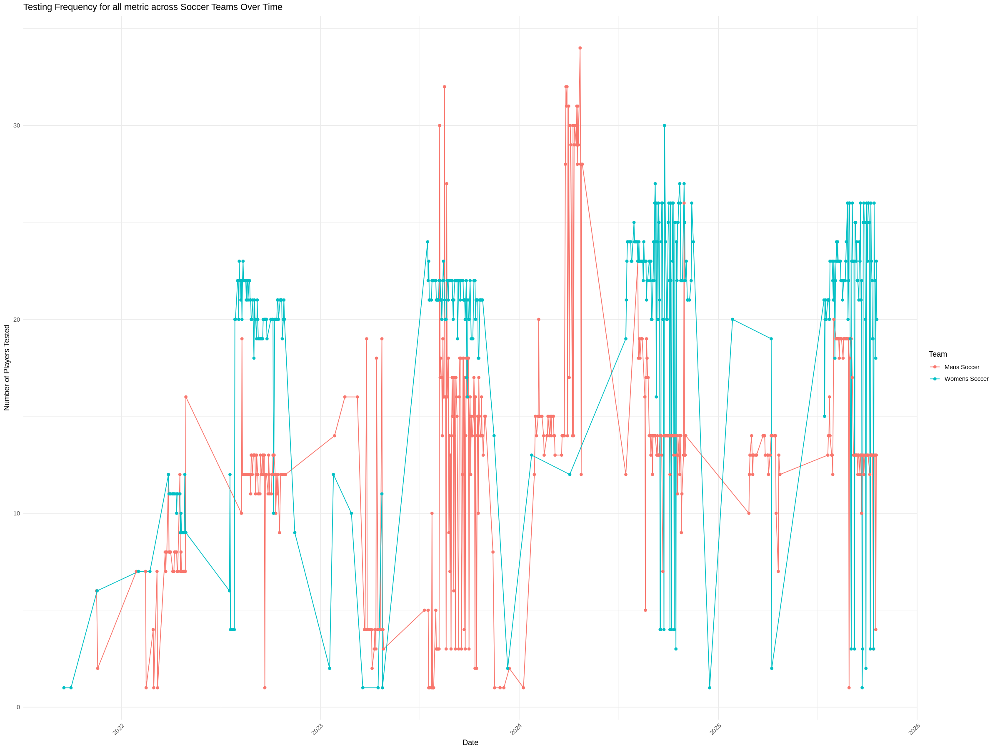

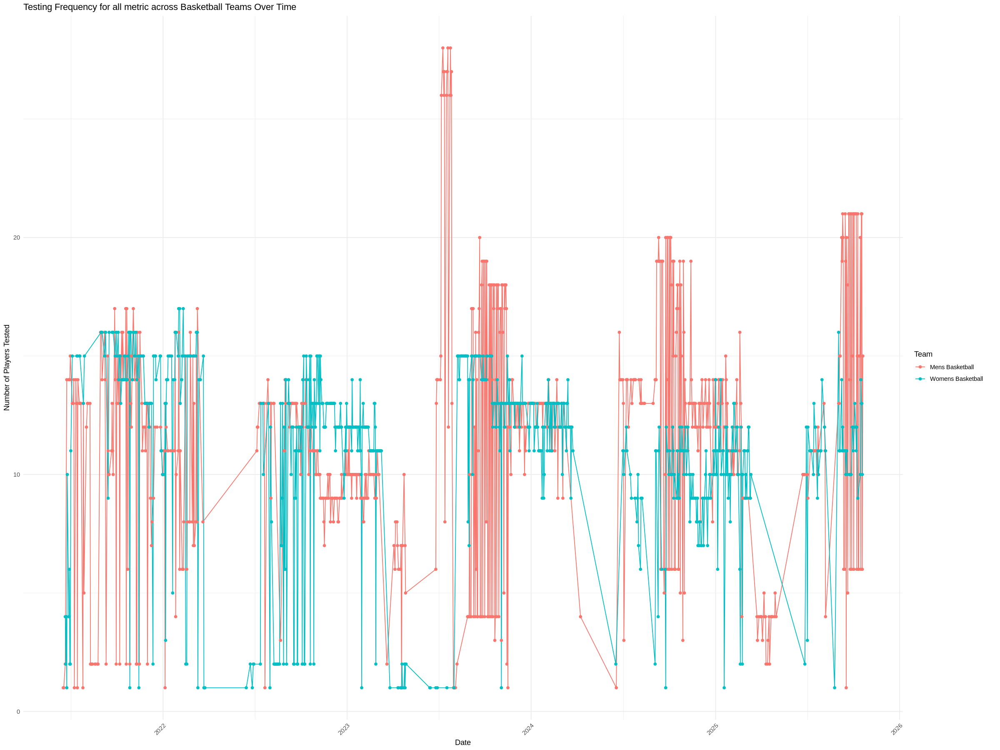

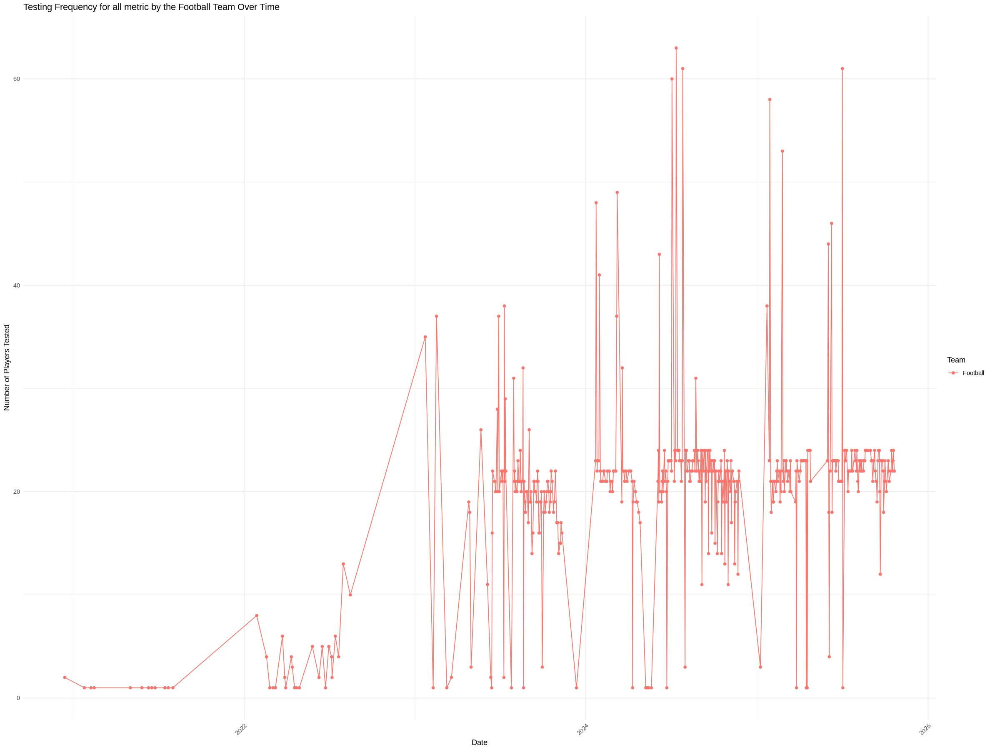

In [30]:
library(ggplot2)
library(dplyr)
library(lubridate)
library(readr)


# Load the dataset, explicitly preventing automatic date parsing for 'timestamp'
# by specifying its colClasses as "character". This ensures we work with raw strings.
# First, determine column names to create a colClasses vector
all_col_names <- c('leftTorque','rightTorque','leftMaxForce','rightMaxForce','accel_load_accum','distance_total')
col_classes_vector <- rep(NA_character_, length(all_col_names))
names(col_classes_vector) <- all_col_names
col_classes_vector["timestamp"] <- "character"

df_raw_timestamp <- read.csv('/content/3.2-1_all_clean_metrics_records_wide_format.csv', colClasses = col_classes_vector)

# Convert 'timestamp' to a Date object using the identified format
df_raw_timestamp$timestamp <- as.Date(parse_date_time(df_raw_timestamp$timestamp, orders = "ymd HMS"))

# Define the list of teams to include
all_selected_teams <- c("Football", "Mens Basketball", "Womens Basketball", "Mens Soccer", "Womens Soccer")

# Define the list of teams to include
basketball_teams <- c( "Mens Basketball", "Womens Basketball")

# Define the list of teams to include
soccer_teams <- c("Mens Soccer", "Womens Soccer")

# Define the list of teams to include
football_team <- c("Football")


# Filter the dataframe to include only the desired teams
selected_metrics_wide_filtered <- df_raw_timestamp %>%
  filter(team %in% all_selected_teams)

# Filter the dataframe to include only the desired teams
soccer_metrics_wide_filtered <- df_raw_timestamp %>%
  filter(team %in% soccer_teams)

# Filter the dataframe to include only the desired teams
basketball_metrics_wide_filtered <- df_raw_timestamp %>%
  filter(team %in% basketball_teams)

# Filter the dataframe to include only the desired teams
football_metrics_wide_filtered <- df_raw_timestamp %>%
  filter(team %in% football_team)



# Aggregate data by team and date to calculate testing frequency
all_selected_testing_frequency <- selected_metrics_wide_filtered %>%
  group_by(team, timestamp) %>% # Group by team and the newly prepared date column
  summarise(testing_count = n_distinct(playername), .groups = 'drop') # Count distinct players tested per day per team

# Aggregate data by team and date to calculate testing frequency
 soccer_testing_frequency <- soccer_metrics_wide_filtered%>%
  group_by(team, timestamp) %>% # Group by team and the newly prepared date column
  summarise(testing_count = n_distinct(playername), .groups = 'drop') # Count distinct players tested per day per team

# Aggregate data by team and date to calculate testing frequency
basketball_testing_frequency <- basketball_metrics_wide_filtered %>%
  group_by(team, timestamp) %>% # Group by team and the newly prepared date column
  summarise(testing_count = n_distinct(playername), .groups = 'drop') # Count distinct players tested per day per team


# Aggregate data by team and date to calculate testing frequency
football_testing_frequency <- football_metrics_wide_filtered %>%
  group_by(team, timestamp) %>% # Group by team and the newly prepared date column
  summarise(testing_count = n_distinct(playername), .groups = 'drop') # Count distinct players tested per day per team


# --- 3. Create Testing Frequency Visualization ---
# Create a line plot to visualize testing frequency by team over time
print(ggplot(all_selected_testing_frequency, aes(x = timestamp, y = testing_count, color = team)) +
  geom_line() + # Plot lines
  geom_point() + # Add points for each data point
  labs(title = "Testing Frequency all metric across all selected Teams Over Time",
       x = "Date",
       y = "Number of Players Tested",
       color = "Team") + # Label for the color legend
  theme_minimal() + # Use a minimal theme for a clean look
  theme(axis.text.x = element_text(angle = 45, hjust = 1))) # Rotate x-axis labels for readability

# Create a line plot to visualize testing frequency by team over time
print(ggplot(soccer_testing_frequency, aes(x = timestamp, y = testing_count, color = team)) +
  geom_line() + # Plot lines
  geom_point() + # Add points for each data point
  labs(title = "Testing Frequency for all metric across Soccer Teams Over Time",
       x = "Date",
       y = "Number of Players Tested",
       color = "Team") + # Label for the color legend
  theme_minimal() + # Use a minimal theme for a clean look
  theme(axis.text.x = element_text(angle = 45, hjust = 1))) # Rotate x-axis labels for readability

# Create a line plot to visualize testing frequency by team over time
print(ggplot(basketball_testing_frequency, aes(x = timestamp, y = testing_count, color = team)) +
  geom_line() + # Plot lines
  geom_point() + # Add points for each data point
  labs(title = "Testing Frequency for all metric across Basketball Teams Over Time",
       x = "Date",
       y = "Number of Players Tested",
       color = "Team") + # Label for the color legend
  theme_minimal() + # Use a minimal theme for a clean look
  theme(axis.text.x = element_text(angle = 45, hjust = 1))) # Rotate x-axis labels for readability

# Create a line plot to visualize testing frequency by team over time
print(ggplot(football_testing_frequency, aes(x = timestamp, y = testing_count, color = team)) +
  geom_line() + # Plot lines
  geom_point() + # Add points for each data point
  labs(title = "Testing Frequency for all metric by the Football Team Over Time",
       x = "Date",
       y = "Number of Players Tested",
       color = "Team") + # Label for the color legend
  theme_minimal() + # Use a minimal theme for a clean look
  theme(axis.text.x = element_text(angle = 45, hjust = 1))) # Rotate x-axis labels for readability

### Test Frequency across all selected teams and non-symmetical metrics
 - Sports - `Football`,`Soccer`,`Basketball`
 - Teams - `Football`,`Mens Soccer`,`Womens Soccer`, `Mens Basket Ball`, `Womens Basketball`
 - Metrics - `accel_load_accum`, `distance_total`

X,playername,timestamp,team,data_source,accel_load_accum,distance_total,leftMaxForce,leftTorque,rightMaxForce,rightTorque,avg_torque_asymmetry,avg_max_force_asymmetry
<int>,<chr>,<date>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>


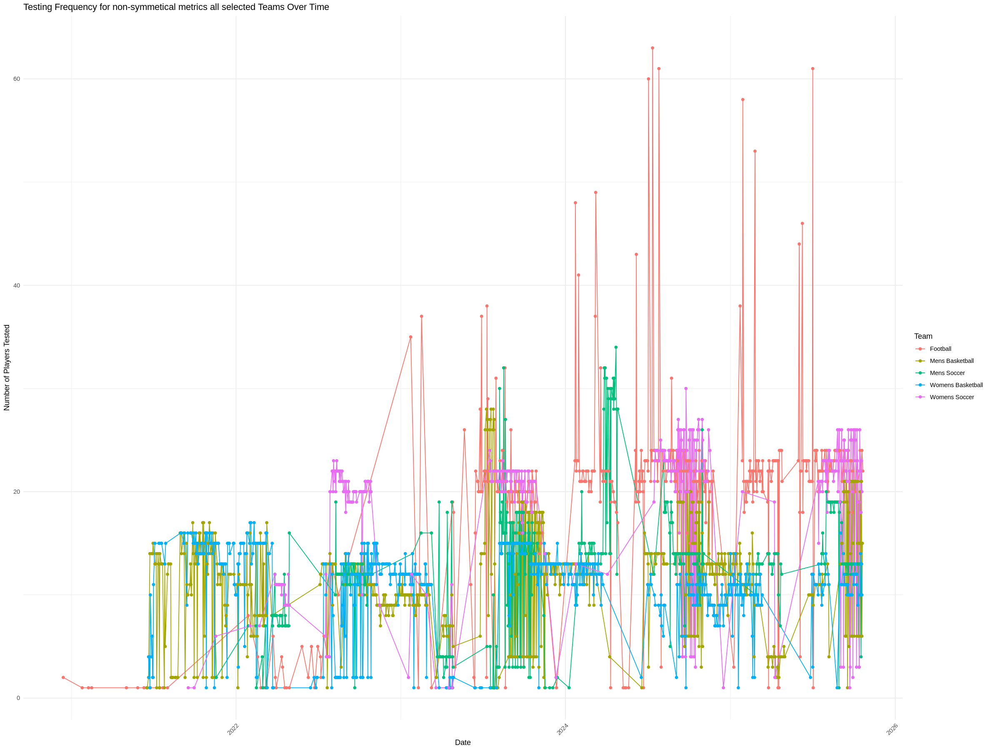

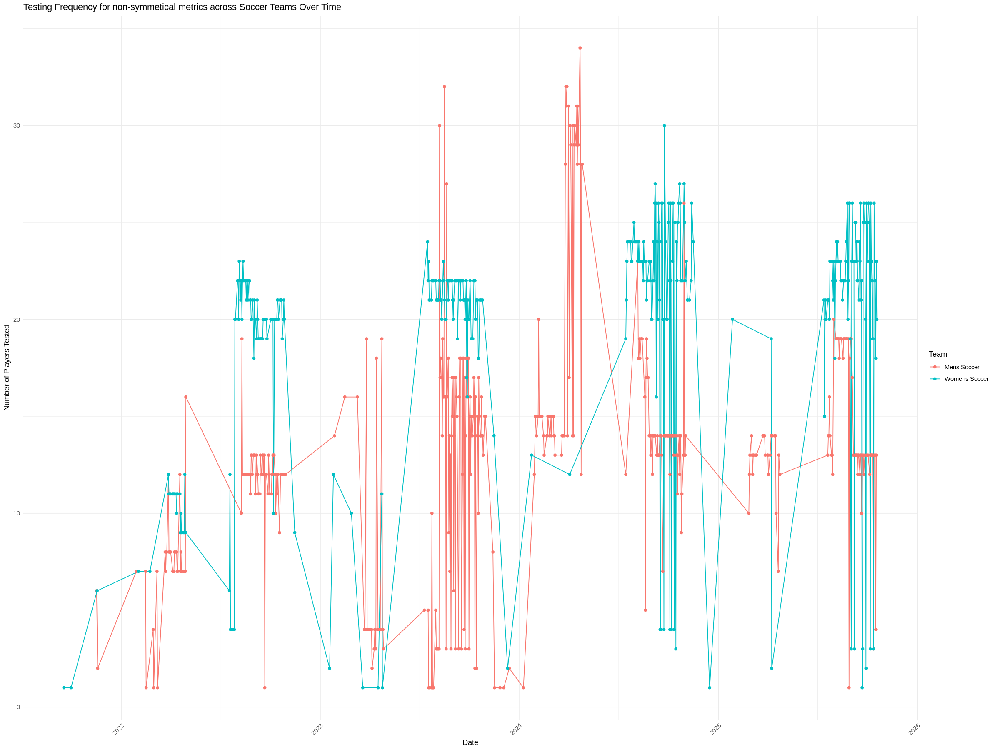

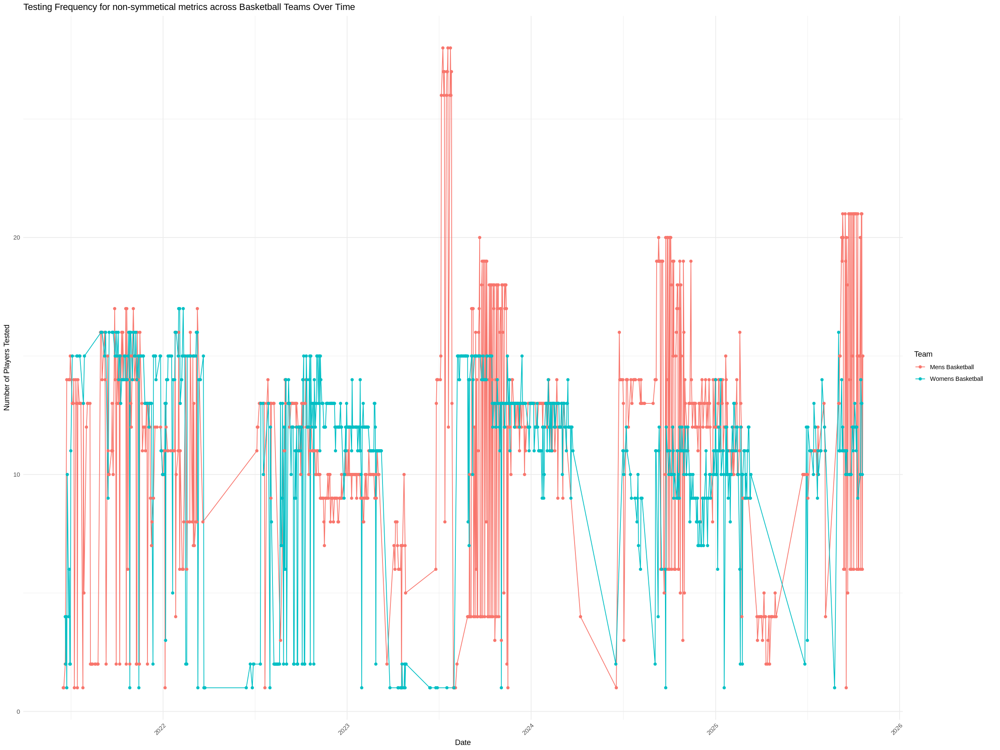

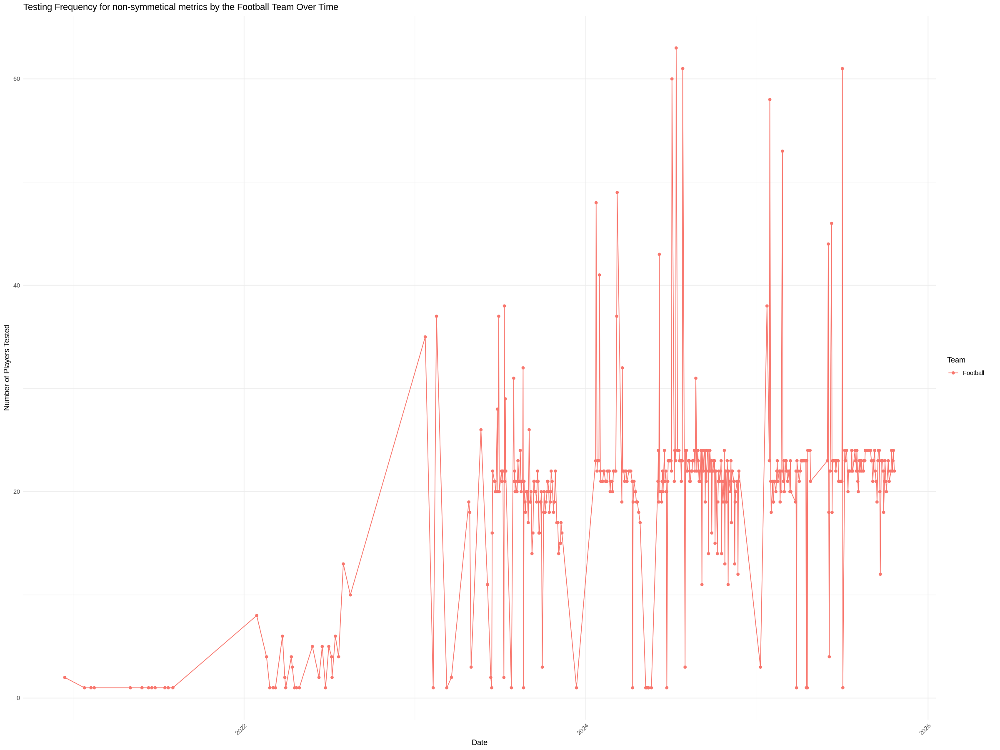

In [31]:
library(ggplot2)
library(dplyr)
library(lubridate)
library(readr)


# Load the dataset, explicitly preventing automatic date parsing for 'timestamp'
# by specifying its colClasses as "character". This ensures we work with raw strings.
# First, determine column names to create a colClasses vector
#all_col_names <- colnames(read.csv('/content/3.2-1_all_clean_metrics_records_wide_format.csv', nrows=1))
all_col_names <- c("accel_load_accum", "distance_total")
col_classes_vector <- rep(NA_character_, length(all_col_names))
names(col_classes_vector) <- all_col_names
col_classes_vector["timestamp"] <- "character"

# Define the list of non-symmetrical metrics to include
non_symmetical_metrics <- c("accel_load_accum", "distance_total")
# print(table(matched_merged_data$distance_load))
# print(table(matched_merged_data$distance_load))
df_raw_timestamp <- read.csv('/content/3.2-1_all_clean_metrics_records_wide_format.csv', colClasses = col_classes_vector)

# Convert 'timestamp' to a Date object using the identified format
df_raw_timestamp$timestamp <- as.Date(parse_date_time(df_raw_timestamp$timestamp, orders = "ymd HMS"))



# Define the list of teams to include
all_selected_teams <- c("Football", "Mens Basketball", "Womens Basketball", "Mens Soccer", "Womens Soccer")

# Define the list of teams to include
basketball_teams <- c( "Mens Basketball", "Womens Basketball")


# Define the list of teams to include
football_team <- c("Football")

# Define the list of teams to include
soccer_teams <- c("Mens Soccer", "Womens Soccer")


# Filter the dataframe to include only nonsymmetrical metrics
selected_metrics_wide_filtered <- df_raw_timestamp %>%
  filter(team %in% non_symmetical_metrics)

head(selected_metrics_wide_filtered)

# Filter the dataframe to include only the desired teams
selected_metrics_wide_filtered <- df_raw_timestamp %>%
  filter(team %in% all_selected_teams)

# Filter the dataframe to include only the desired teams
soccer_metrics_wide_filtered <- df_raw_timestamp %>%
  filter(team %in% soccer_teams)

# Filter the dataframe to include only the desired teams
basketball_metrics_wide_filtered <- df_raw_timestamp %>%
  filter(team %in% basketball_teams)

# Filter the dataframe to include only the desired teams
football_metrics_wide_filtered <- df_raw_timestamp %>%
  filter(team %in% football_team)



# Aggregate data by team and date to calculate testing frequency
all_selected_testing_frequency <- selected_metrics_wide_filtered %>%
  group_by(team, timestamp) %>% # Group by team and the newly prepared date column
  summarise(testing_count = n_distinct(playername), .groups = 'drop') # Count distinct players tested per day per team

# Aggregate data by team and date to calculate testing frequency
 soccer_testing_frequency <- soccer_metrics_wide_filtered%>%
  group_by(team, timestamp) %>% # Group by team and the newly prepared date column
  summarise(testing_count = n_distinct(playername), .groups = 'drop') # Count distinct players tested per day per team

# Aggregate data by team and date to calculate testing frequency
basketball_testing_frequency <- basketball_metrics_wide_filtered %>%
  group_by(team, timestamp) %>% # Group by team and the newly prepared date column
  summarise(testing_count = n_distinct(playername), .groups = 'drop') # Count distinct players tested per day per team


# Aggregate data by team and date to calculate testing frequency
football_testing_frequency <- football_metrics_wide_filtered %>%
  group_by(team, timestamp) %>% # Group by team and the newly prepared date column
  summarise(testing_count = n_distinct(playername), .groups = 'drop') # Count distinct players tested per day per team


# --- 3. Create Testing Frequency Visualization ---
# Create a line plot to visualize testing frequency by team over time
print(ggplot(all_selected_testing_frequency, aes(x = timestamp, y = testing_count, color = team)) +
  geom_line() + # Plot lines
  geom_point() + # Add points for each data point
  labs(title = "Testing Frequency for non-symmetical metrics all selected Teams Over Time",
       x = "Date",
       y = "Number of Players Tested",
       color = "Team") +
  theme_minimal() +
  theme(axis.text.x = element_text(angle = 45, hjust = 1)))

# Create a line plot to visualize testing frequency by team over time
print(ggplot(soccer_testing_frequency, aes(x = timestamp, y = testing_count, color = team)) +
  geom_line() +
  geom_point() +
  labs(title = "Testing Frequency for non-symmetical metrics across Soccer Teams Over Time",
       x = "Date",
       y = "Number of Players Tested",
       color = "Team") +
  theme_minimal() +
  theme(axis.text.x = element_text(angle = 45, hjust = 1)))

# Create a line plot to visualize testing frequency by team over time
print(ggplot(basketball_testing_frequency, aes(x = timestamp, y = testing_count, color = team)) +
  geom_line() +
  geom_point() +
  labs(title = "Testing Frequency for non-symmetical metrics across Basketball Teams Over Time",
       x = "Date",
       y = "Number of Players Tested",
       color = "Team") +
  theme_minimal() +
  theme(axis.text.x = element_text(angle = 45, hjust = 1)))

# Create a line plot to visualize testing frequency by team over time
print(ggplot(football_testing_frequency, aes(x = timestamp, y = testing_count, color = team)) +
  geom_line() +
  geom_point() +
  labs(title = "Testing Frequency for non-symmetical metrics by the Football Team Over Time",
       x = "Date",
       y = "Number of Players Tested",
       color = "Team") +
  theme_minimal() +
  theme(axis.text.x = element_text(angle = 45, hjust = 1)))

### Test Frequency across all selected teams and symmetrical metrics
 - Sports - `Football`,`Soccer`,`Basketball`
 - Teams - `Football`,`Mens Soccer`,`Womens Soccer`, `Mens Basket Ball`, `Womens Basketball`
 - Metrics - `leftMaxForce`, `rightMaxForce`, `leftTorque`, `rightTorque`

< table of extent 0 >
< table of extent 0 >


X,playername,timestamp,team,data_source,accel_load_accum,distance_total,leftMaxForce,leftTorque,rightMaxForce,rightTorque,avg_torque_asymmetry,avg_max_force_asymmetry
<int>,<chr>,<date>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>


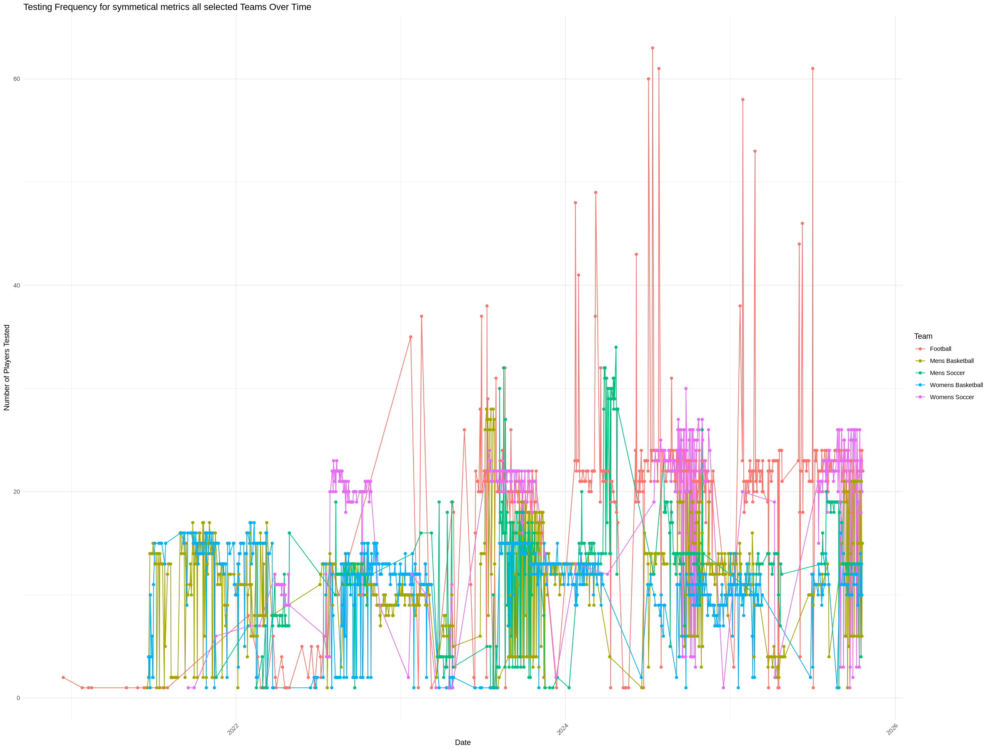

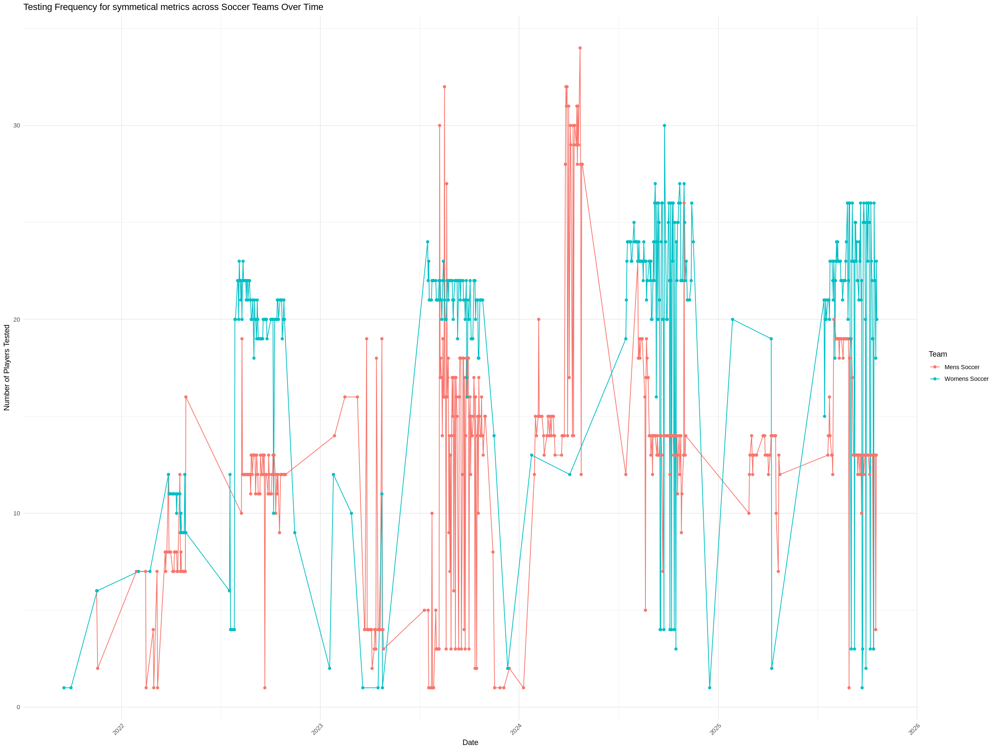

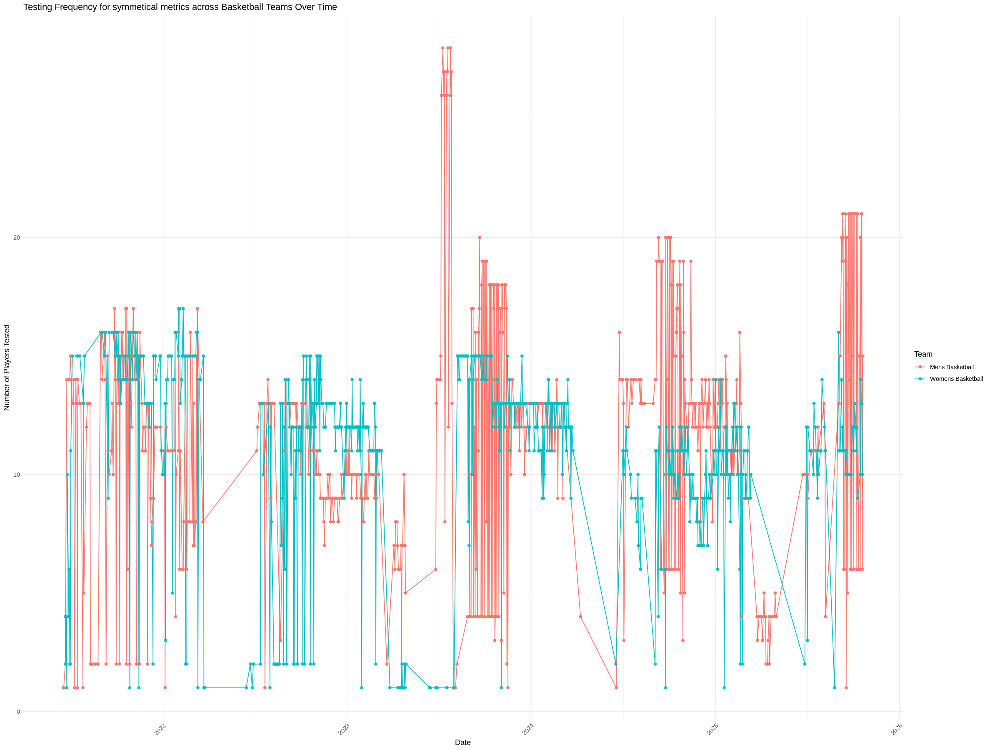

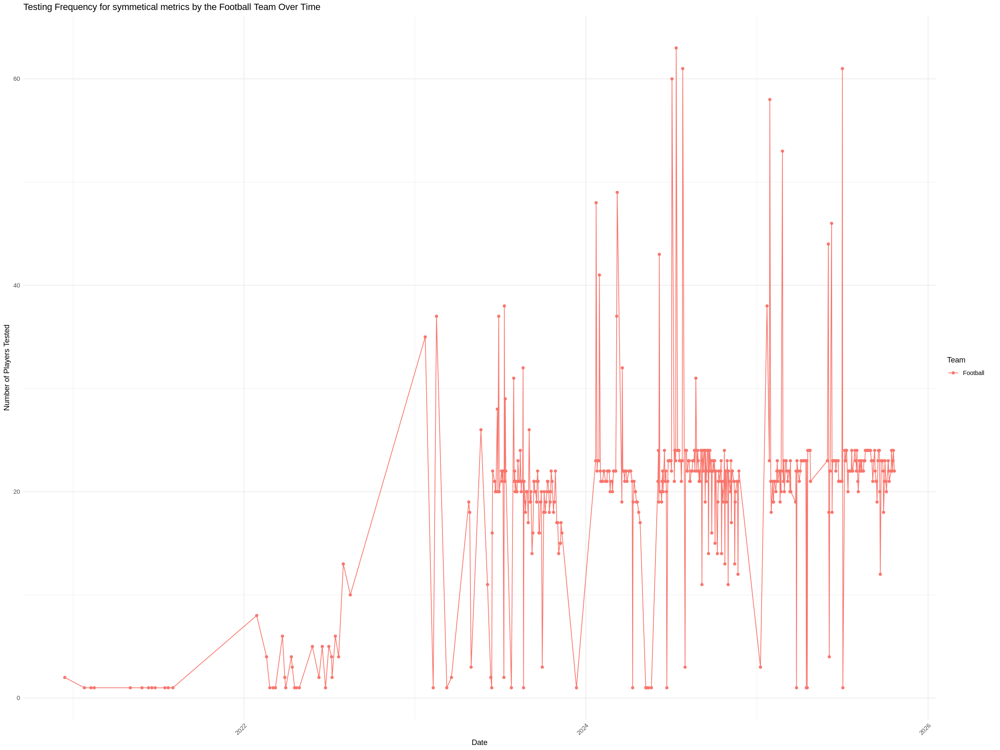

In [32]:
library(ggplot2)
library(dplyr)
library(lubridate)
library(readr)


# Load the dataset, explicitly preventing automatic date parsing for 'timestamp'
# by specifying its colClasses as "character". This ensures we work with raw strings.
# First, determine column names to create a colClasses vector
#all_col_names <- colnames(read.csv('/content/3.2-1_all_clean_metrics_records_wide_format.csv', nrows=1))
all_col_names <- c("leftTorque", "rightTorque","leftMaxForce","rightMaxForce")
col_classes_vector <- rep(NA_character_, length(all_col_names))
names(col_classes_vector) <- all_col_names
col_classes_vector["timestamp"] <- "character"

# Define the list of non-symmetrical metrics to include
#non_symmetical_metrics <- c("accel_load_accum", "distance_load")
 print(table(matched_merged_data$distance_load))
 print(table(matched_merged_data$distance_load))
df_raw_timestamp <- read.csv('/content/3.2-1_all_clean_metrics_records_wide_format.csv', colClasses = col_classes_vector)

# Convert 'timestamp' to a Date object using the identified format
df_raw_timestamp$timestamp <- as.Date(parse_date_time(df_raw_timestamp$timestamp, orders = "ymd HMS"))



# Define the list of teams to include
all_selected_teams <- c("Football", "Mens Basketball", "Womens Basketball", "Mens Soccer", "Womens Soccer")

# Define the list of teams to include
basketball_teams <- c( "Mens Basketball", "Womens Basketball")


# Define the list of teams to include
football_team <- c("Football")

# Define the list of teams to include
soccer_teams <- c("Mens Soccer", "Womens Soccer")


# Filter the dataframe to include only nonsymmetrical metrics
selected_metrics_wide_filtered <- df_raw_timestamp %>%
  filter(team %in% non_symmetical_metrics)

head(selected_metrics_wide_filtered)

# Filter the dataframe to include only the desired teams
selected_metrics_wide_filtered <- df_raw_timestamp %>%
  filter(team %in% all_selected_teams)

# Filter the dataframe to include only the desired teams
soccer_metrics_wide_filtered <- df_raw_timestamp %>%
  filter(team %in% soccer_teams)

# Filter the dataframe to include only the desired teams
basketball_metrics_wide_filtered <- df_raw_timestamp %>%
  filter(team %in% basketball_teams)

# Filter the dataframe to include only the desired teams
football_metrics_wide_filtered <- df_raw_timestamp %>%
  filter(team %in% football_team)



# Aggregate data by team and date to calculate testing frequency
all_selected_testing_frequency <- selected_metrics_wide_filtered %>%
  group_by(team, timestamp) %>% # Group by team and the newly prepared date column
  summarise(testing_count = n_distinct(playername), .groups = 'drop') # Count distinct players tested per day per team

# Aggregate data by team and date to calculate testing frequency
 soccer_testing_frequency <- soccer_metrics_wide_filtered%>%
  group_by(team, timestamp) %>% # Group by team and the newly prepared date column
  summarise(testing_count = n_distinct(playername), .groups = 'drop') # Count distinct players tested per day per team

# Aggregate data by team and date to calculate testing frequency
basketball_testing_frequency <- basketball_metrics_wide_filtered %>%
  group_by(team, timestamp) %>% # Group by team and the newly prepared date column
  summarise(testing_count = n_distinct(playername), .groups = 'drop') # Count distinct players tested per day per team


# Aggregate data by team and date to calculate testing frequency
football_testing_frequency <- football_metrics_wide_filtered %>%
  group_by(team, timestamp) %>% # Group by team and the newly prepared date column
  summarise(testing_count = n_distinct(playername), .groups = 'drop') # Count distinct players tested per day per team


# --- 3. Create Testing Frequency Visualization ---
# Create a line plot to visualize testing frequency by team over time
print(ggplot(all_selected_testing_frequency, aes(x = timestamp, y = testing_count, color = team)) +
  geom_line() + # Plot lines
  geom_point() + # Add points for each data point
  labs(title = "Testing Frequency for symmetical metrics all selected Teams Over Time",
       x = "Date",
       y = "Number of Players Tested",
       color = "Team") + # Label for the color legend
  theme_minimal() + # Use a minimal theme for a clean look
  theme(axis.text.x = element_text(angle = 45, hjust = 1))) # Rotate x-axis labels for readability

# Create a line plot to visualize testing frequency by team over time
print(ggplot(soccer_testing_frequency, aes(x = timestamp, y = testing_count, color = team)) +
  geom_line() + # Plot lines
  geom_point() + # Add points for each data point
  labs(title = "Testing Frequency for symmetical metrics across Soccer Teams Over Time",
       x = "Date",
       y = "Number of Players Tested",
       color = "Team") + # Label for the color legend
  theme_minimal() + # Use a minimal theme for a clean look
  theme(axis.text.x = element_text(angle = 45, hjust = 1))) # Rotate x-axis labels for readability

# Create a line plot to visualize testing frequency by team over time
print(ggplot(basketball_testing_frequency, aes(x = timestamp, y = testing_count, color = team)) +
  geom_line() + # Plot lines
  geom_point() + # Add points for each data point
  labs(title = "Testing Frequency for symmetical metrics across Basketball Teams Over Time",
       x = "Date",
       y = "Number of Players Tested",
       color = "Team") + # Label for the color legend
  theme_minimal() + # Use a minimal theme for a clean look
  theme(axis.text.x = element_text(angle = 45, hjust = 1))) # Rotate x-axis labels for readability

# Create a line plot to visualize testing frequency by team over time
print(ggplot(football_testing_frequency, aes(x = timestamp, y = testing_count, color = team)) +
  geom_line() + # Plot lines
  geom_point() + # Add points for each data point
  labs(title = "Testing Frequency for symmetical metrics by the Football Team Over Time",
       x = "Date",
       y = "Number of Players Tested",
       color = "Team") + # Label for the color legend
  theme_minimal() + # Use a minimal theme for a clean look
  theme(axis.text.x = element_text(angle = 45, hjust = 1))) # Rotate x-axis labels for readability


## Create a line plot to visualize testing frequency by team over time for  `Matched Metrics`

### Test Frequency across all selected teams and metrics
 - Sports - `Football`,`Soccer`,`Basketball`
 - Teams - `Football`,`Mens Soccer`,`Womens Soccer`, `Mens Basket Ball`, `Womens Basketball`
 - Metrics - `leftMaxForce`, `rightMaxForce`, `leftTorque`, `rightTorque`, `accel_load_accum`, `distance_total`

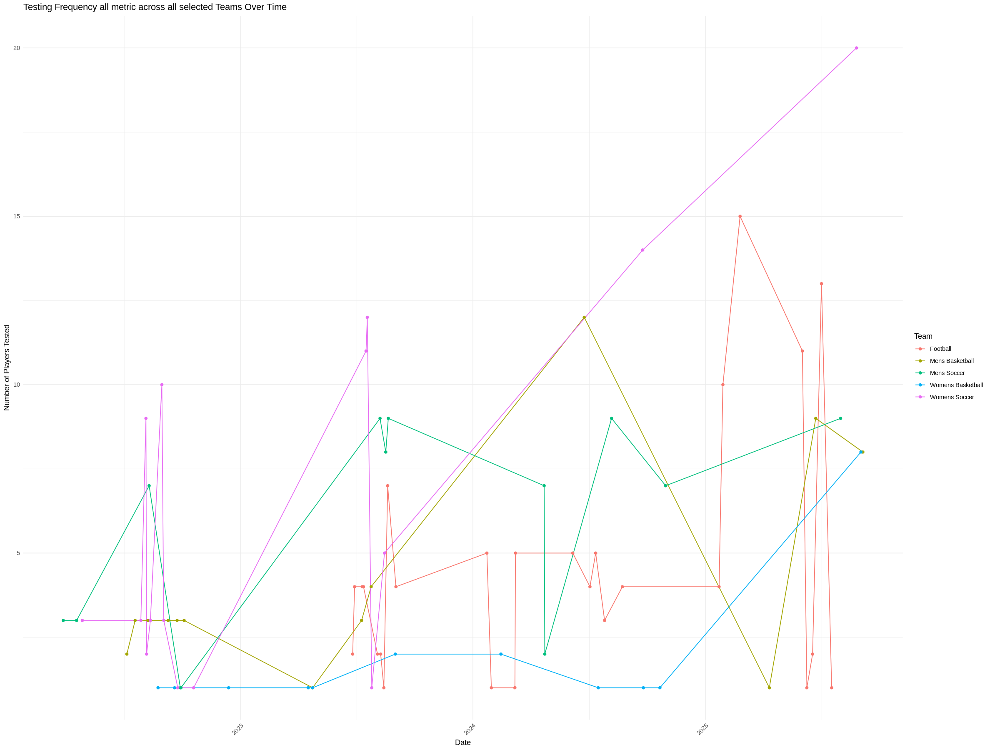

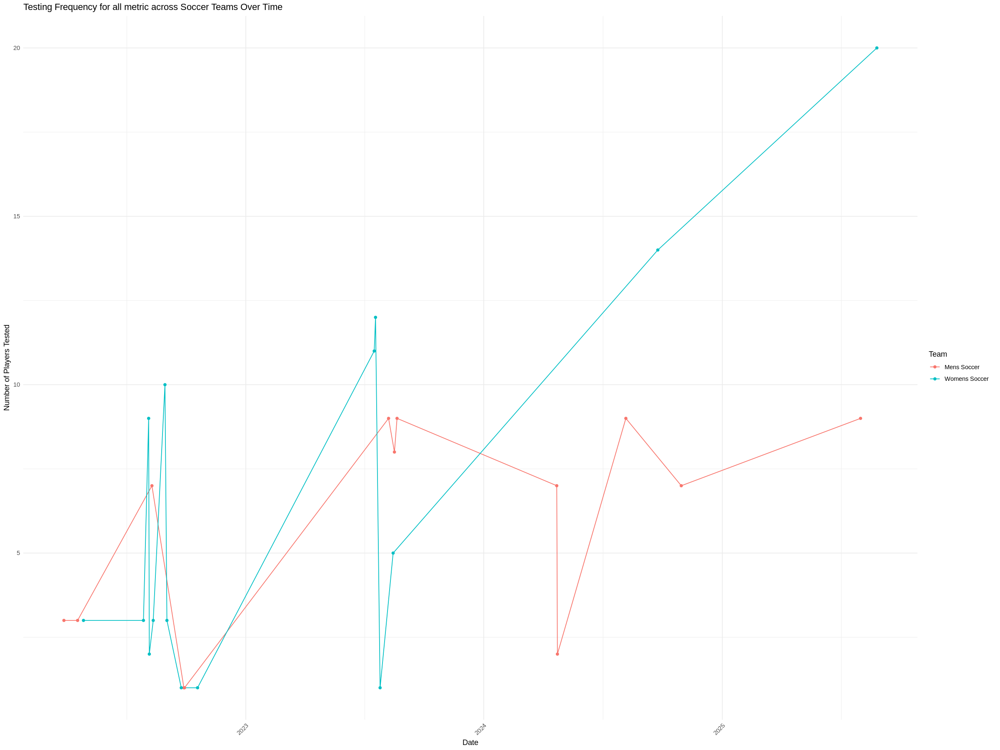

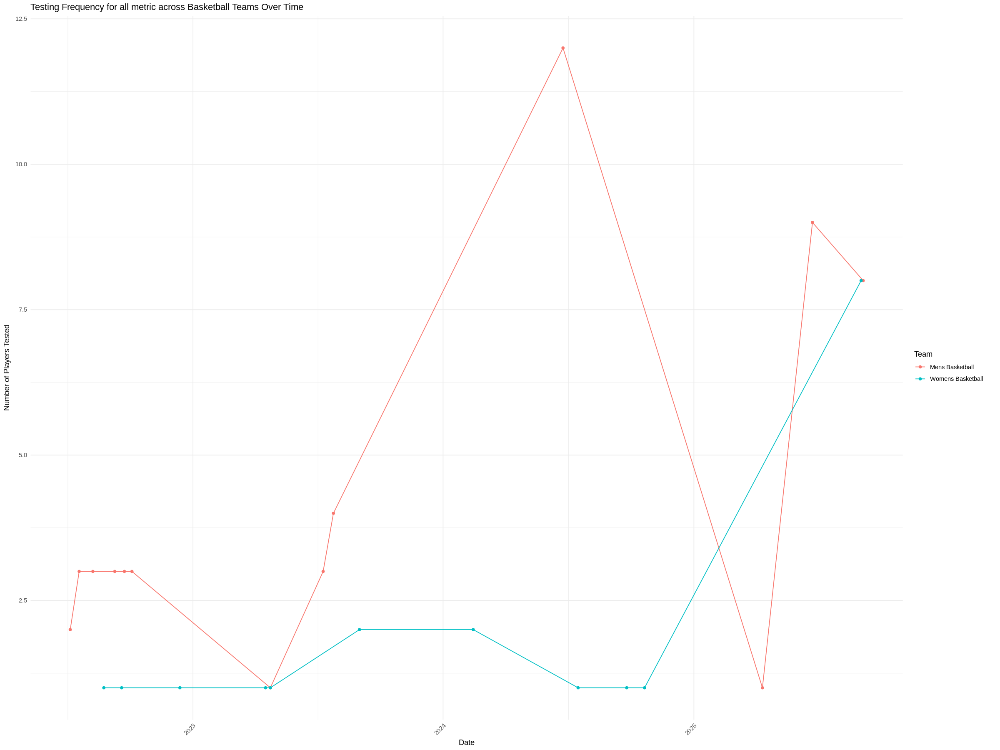

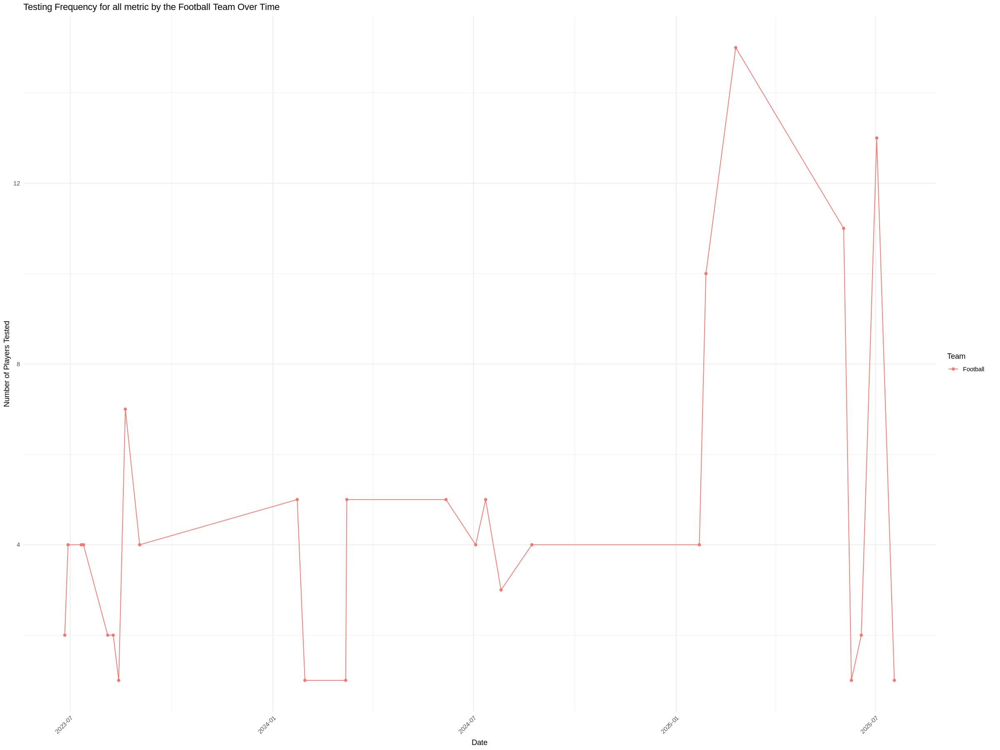

In [33]:
library(ggplot2)
library(dplyr)
library(lubridate)
library(readr)


# Load the dataset, explicitly preventing automatic date parsing for 'test_timestamp'
# by specifying its colClasses as "character". This ensures we work with raw strings.
# First, determine column names to create a colClasses vector
all_col_names <- c('leftTorque','rightTorque','leftMaxForce','rightMaxForce','accel_load_accum','distance_total')
col_classes_vector <- rep(NA_character_, length(all_col_names))
names(col_classes_vector) <- all_col_names
col_classes_vector["test_timestamp"] <- "character"

df_raw_timestamp <- read.csv('/content/3.2-2_matched_metrics_by_date_wide_format.csv', colClasses = col_classes_vector)

# Convert 'test_timestamp' to a Date object using the identified format
df_raw_timestamp$test_timestamp <- as.Date(parse_date_time(df_raw_timestamp$test_timestamp, orders = "ymd HMS"))

# Define the list of teams to include
all_selected_teams <- c("Football", "Mens Basketball", "Womens Basketball", "Mens Soccer", "Womens Soccer")

# Define the list of teams to include
basketball_teams <- c( "Mens Basketball", "Womens Basketball")

# Define the list of teams to include
soccer_teams <- c("Mens Soccer", "Womens Soccer")

# Define the list of teams to include
football_team <- c("Football")


# Filter the dataframe to include only the desired teams
selected_metrics_wide_filtered <- df_raw_timestamp %>%
  filter(team %in% all_selected_teams)

# Filter the dataframe to include only the desired teams
soccer_metrics_wide_filtered <- df_raw_timestamp %>%
  filter(team %in% soccer_teams)

# Filter the dataframe to include only the desired teams
basketball_metrics_wide_filtered <- df_raw_timestamp %>%
  filter(team %in% basketball_teams)

# Filter the dataframe to include only the desired teams
football_metrics_wide_filtered <- df_raw_timestamp %>%
  filter(team %in% football_team)



# Aggregate data by team and date to calculate testing frequency
all_selected_testing_frequency <- selected_metrics_wide_filtered %>%
  group_by(team, test_timestamp) %>% # Group by team and the newly prepared date column
  summarise(testing_count = n_distinct(playername), .groups = 'drop') # Count distinct players tested per day per team

# Aggregate data by team and date to calculate testing frequency
 soccer_testing_frequency <- soccer_metrics_wide_filtered%>%
  group_by(team, test_timestamp) %>% # Group by team and the newly prepared date column
  summarise(testing_count = n_distinct(playername), .groups = 'drop') # Count distinct players tested per day per team

# Aggregate data by team and date to calculate testing frequency
basketball_testing_frequency <- basketball_metrics_wide_filtered %>%
  group_by(team, test_timestamp) %>% # Group by team and the newly prepared date column
  summarise(testing_count = n_distinct(playername), .groups = 'drop') # Count distinct players tested per day per team


# Aggregate data by team and date to calculate testing frequency
football_testing_frequency <- football_metrics_wide_filtered %>%
  group_by(team, test_timestamp) %>% # Group by team and the newly prepared date column
  summarise(testing_count = n_distinct(playername), .groups = 'drop') # Count distinct players tested per day per team


# --- 3. Create Testing Frequency Visualization ---
# Create a line plot to visualize testing frequency by team over time
print(ggplot(all_selected_testing_frequency, aes(x = test_timestamp, y = testing_count, color = team)) +
  geom_line() + # Plot lines
  geom_point() + # Add points for each data point
  labs(title = "Testing Frequency all metric across all selected Teams Over Time",
       x = "Date",
       y = "Number of Players Tested",
       color = "Team") + # Label for the color legend
  theme_minimal() + # Use a minimal theme for a clean look
  theme(axis.text.x = element_text(angle = 45, hjust = 1))) # Rotate x-axis labels for readability

# Create a line plot to visualize testing frequency by team over time
print(ggplot(soccer_testing_frequency, aes(x = test_timestamp, y = testing_count, color = team)) +
  geom_line() + # Plot lines
  geom_point() + # Add points for each data point
  labs(title = "Testing Frequency for all metric across Soccer Teams Over Time",
       x = "Date",
       y = "Number of Players Tested",
       color = "Team") + # Label for the color legend
  theme_minimal() + # Use a minimal theme for a clean look
  theme(axis.text.x = element_text(angle = 45, hjust = 1))) # Rotate x-axis labels for readability

# Create a line plot to visualize testing frequency by team over time
print(ggplot(basketball_testing_frequency, aes(x = test_timestamp, y = testing_count, color = team)) +
  geom_line() + # Plot lines
  geom_point() + # Add points for each data point
  labs(title = "Testing Frequency for all metric across Basketball Teams Over Time",
       x = "Date",
       y = "Number of Players Tested",
       color = "Team") + # Label for the color legend
  theme_minimal() + # Use a minimal theme for a clean look
  theme(axis.text.x = element_text(angle = 45, hjust = 1))) # Rotate x-axis labels for readability

# Create a line plot to visualize testing frequency by team over time
print(ggplot(football_testing_frequency, aes(x = test_timestamp, y = testing_count, color = team)) +
  geom_line() + # Plot lines
  geom_point() + # Add points for each data point
  labs(title = "Testing Frequency for all metric by the Football Team Over Time",
       x = "Date",
       y = "Number of Players Tested",
       color = "Team") + # Label for the color legend
  theme_minimal() + # Use a minimal theme for a clean look
  theme(axis.text.x = element_text(angle = 45, hjust = 1))) # Rotate x-axis labels for readability

### Test Frequency across all selected teams and non-symmetical metrics
 - Sports - `Football`,`Soccer`,`Basketball`
 - Teams - `Football`,`Mens Soccer`,`Womens Soccer`, `Mens Basket Ball`, `Womens Basketball`
 - Metrics - `accel_load_accum`, `distance_total`

< table of extent 0 >
< table of extent 0 >


Warning message in read.table(file = file, header = header, sep = sep, quote = quote, :
“not all columns named in 'colClasses' exist”


test_date,test_timestamp,playername,team,leftMaxForce,rightMaxForce,avg_max_force_asymmetry,leftTorque,rightTorque,avg_torque_asymmetry,accel_load_accum,distance_total,accel_distance_test_date,accel_distance_timestamp
<chr>,<date>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>


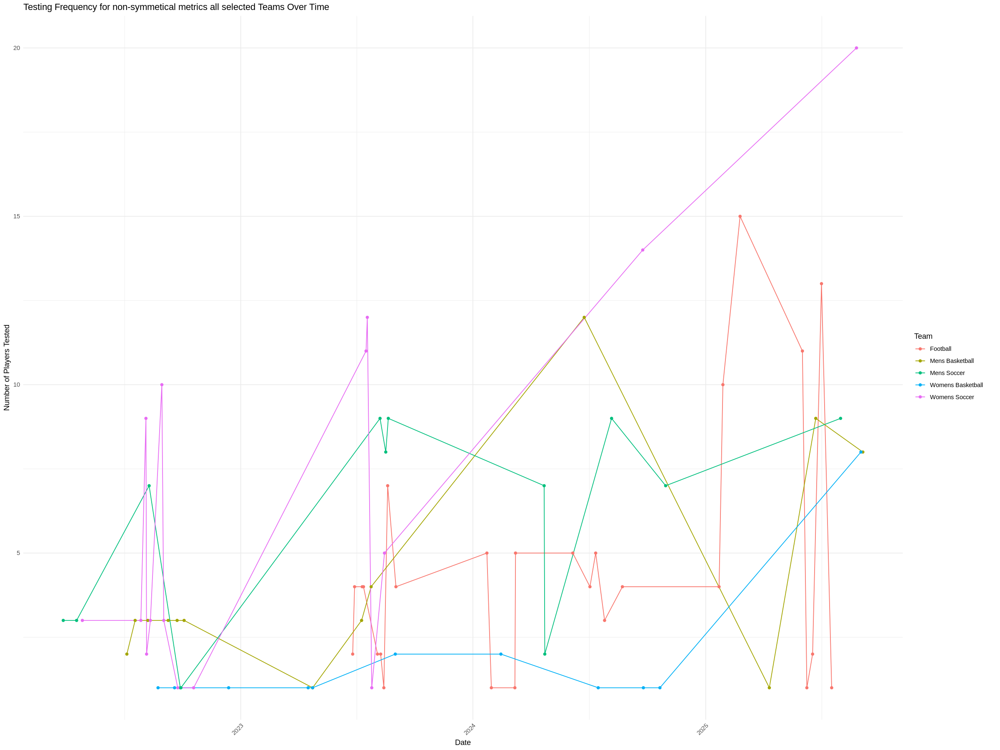

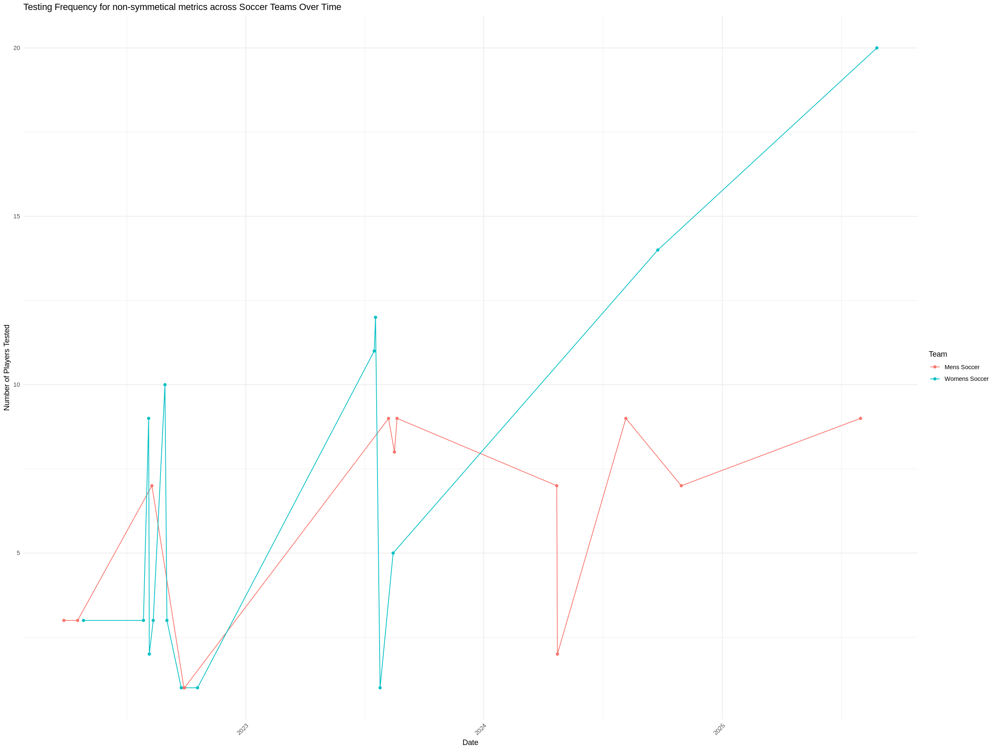

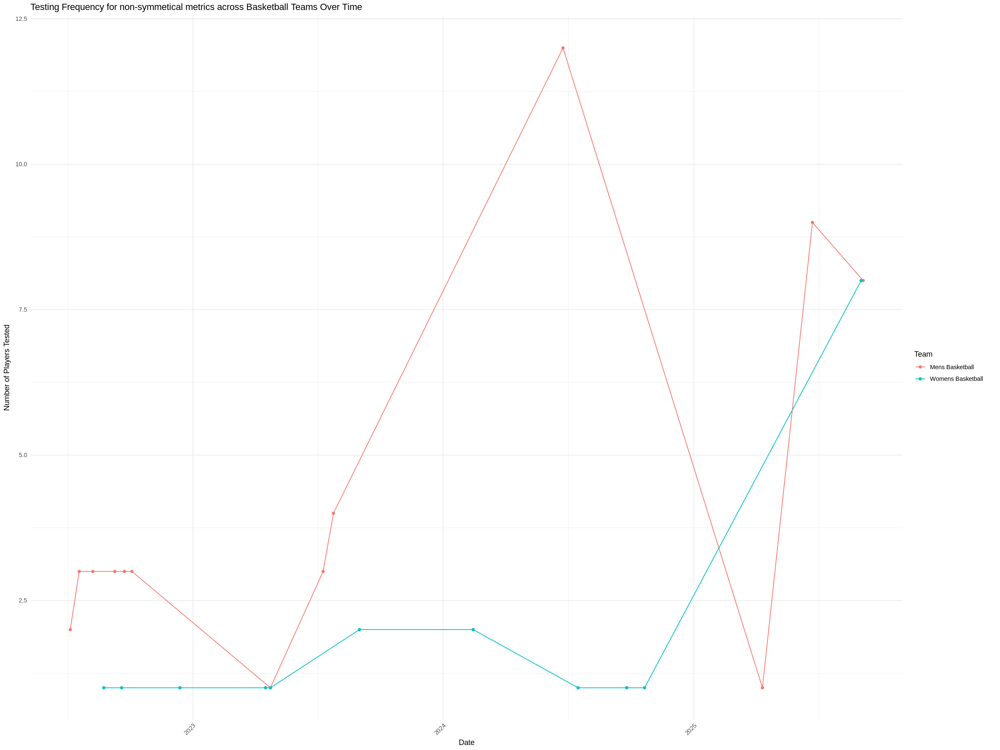

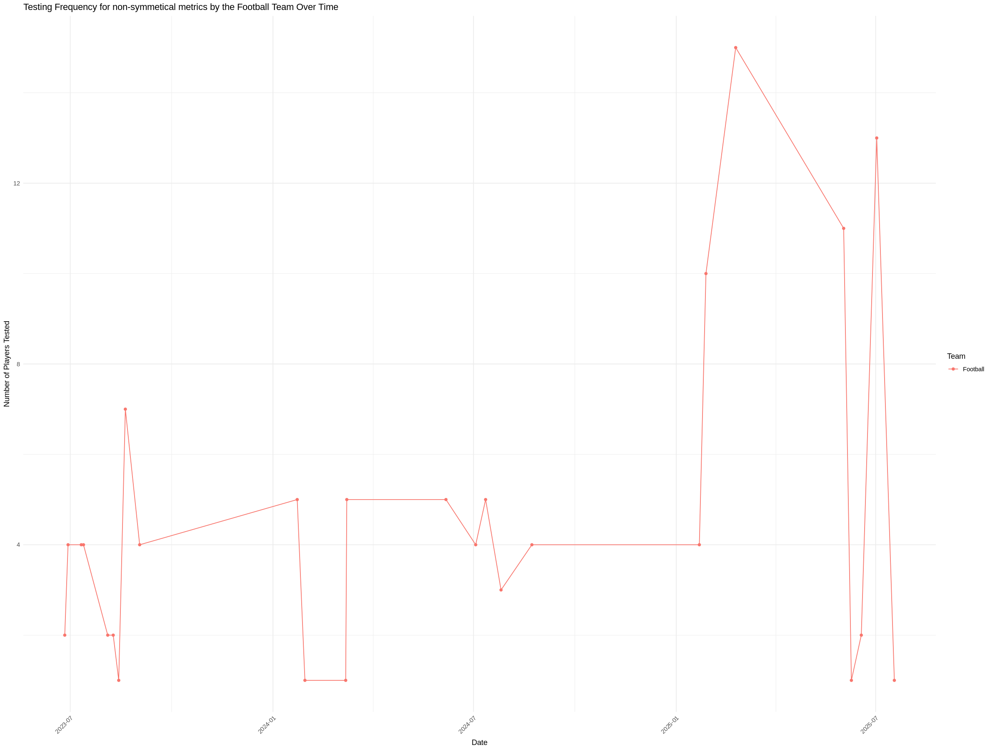

In [34]:
library(ggplot2)
library(dplyr)
library(lubridate)
library(readr)


# Load the dataset, explicitly preventing automatic date parsing for 'test_timestamp'
# by specifying its colClasses as "character". This ensures we work with raw strings.
# First, determine column names to create a colClasses vector
#all_col_names <- colnames(read.csv('/content/3.2-2_matched_metrics_by_date_wide_format.csv', nrows=1))
all_col_names <- c("accel_load_accum", "distance_load")
col_classes_vector <- rep(NA_character_, length(all_col_names))
names(col_classes_vector) <- all_col_names
col_classes_vector["test_timestamp"] <- "character"

# Define the list of non-symmetrical metrics to include
#non_symmetical_metrics <- c("accel_load_accum", "distance_load")
 print(table(matched_merged_data$distance_load))
 print(table(matched_merged_data$distance_load))
df_raw_timestamp <- read.csv('/content/3.2-2_matched_metrics_by_date_wide_format.csv', colClasses = col_classes_vector)

# Convert 'test_timestamp' to a Date object using the identified format
df_raw_timestamp$test_timestamp <- as.Date(parse_date_time(df_raw_timestamp$test_timestamp, orders = "ymd HMS"))



# Define the list of teams to include
all_selected_teams <- c("Football", "Mens Basketball", "Womens Basketball", "Mens Soccer", "Womens Soccer")

# Define the list of teams to include
basketball_teams <- c( "Mens Basketball", "Womens Basketball")


# Define the list of teams to include
football_team <- c("Football")

# Define the list of teams to include
soccer_teams <- c("Mens Soccer", "Womens Soccer")


# Filter the dataframe to include only nonsymmetrical metrics
selected_metrics_wide_filtered <- df_raw_timestamp %>%
  filter(team %in% non_symmetical_metrics)

head(selected_metrics_wide_filtered)

# Filter the dataframe to include only the desired teams
selected_metrics_wide_filtered <- df_raw_timestamp %>%
  filter(team %in% all_selected_teams)

# Filter the dataframe to include only the desired teams
soccer_metrics_wide_filtered <- df_raw_timestamp %>%
  filter(team %in% soccer_teams)

# Filter the dataframe to include only the desired teams
basketball_metrics_wide_filtered <- df_raw_timestamp %>%
  filter(team %in% basketball_teams)

# Filter the dataframe to include only the desired teams
football_metrics_wide_filtered <- df_raw_timestamp %>%
  filter(team %in% football_team)



# Aggregate data by team and date to calculate testing frequency
all_selected_testing_frequency <- selected_metrics_wide_filtered %>%
  group_by(team, test_timestamp) %>% # Group by team and the newly prepared date column
  summarise(testing_count = n_distinct(playername), .groups = 'drop') # Count distinct players tested per day per team

# Aggregate data by team and date to calculate testing frequency
 soccer_testing_frequency <- soccer_metrics_wide_filtered%>%
  group_by(team, test_timestamp) %>% # Group by team and the newly prepared date column
  summarise(testing_count = n_distinct(playername), .groups = 'drop') # Count distinct players tested per day per team

# Aggregate data by team and date to calculate testing frequency
basketball_testing_frequency <- basketball_metrics_wide_filtered %>%
  group_by(team, test_timestamp) %>% # Group by team and the newly prepared date column
  summarise(testing_count = n_distinct(playername), .groups = 'drop') # Count distinct players tested per day per team


# Aggregate data by team and date to calculate testing frequency
football_testing_frequency <- football_metrics_wide_filtered %>%
  group_by(team, test_timestamp) %>% # Group by team and the newly prepared date column
  summarise(testing_count = n_distinct(playername), .groups = 'drop') # Count distinct players tested per day per team


# --- 3. Create Testing Frequency Visualization ---
# Create a line plot to visualize testing frequency by team over time
print(ggplot(all_selected_testing_frequency, aes(x = test_timestamp, y = testing_count, color = team)) +
  geom_line() + # Plot lines
  geom_point() + # Add points for each data point
  labs(title = "Testing Frequency for non-symmetical metrics all selected Teams Over Time",
       x = "Date",
       y = "Number of Players Tested",
       color = "Team") + # Label for the color legend
  theme_minimal() + # Use a minimal theme for a clean look
  theme(axis.text.x = element_text(angle = 45, hjust = 1))) # Rotate x-axis labels for readability

# Create a line plot to visualize testing frequency by team over time
print(ggplot(soccer_testing_frequency, aes(x = test_timestamp, y = testing_count, color = team)) +
  geom_line() + # Plot lines
  geom_point() + # Add points for each data point
  labs(title = "Testing Frequency for non-symmetical metrics across Soccer Teams Over Time",
       x = "Date",
       y = "Number of Players Tested",
       color = "Team") + # Label for the color legend
  theme_minimal() + # Use a minimal theme for a clean look
  theme(axis.text.x = element_text(angle = 45, hjust = 1))) # Rotate x-axis labels for readability

# Create a line plot to visualize testing frequency by team over time
print(ggplot(basketball_testing_frequency, aes(x = test_timestamp, y = testing_count, color = team)) +
  geom_line() + # Plot lines
  geom_point() + # Add points for each data point
  labs(title = "Testing Frequency for non-symmetical metrics across Basketball Teams Over Time",
       x = "Date",
       y = "Number of Players Tested",
       color = "Team") + # Label for the color legend
  theme_minimal() + # Use a minimal theme for a clean look
  theme(axis.text.x = element_text(angle = 45, hjust = 1))) # Rotate x-axis labels for readability

# Create a line plot to visualize testing frequency by team over time
print(ggplot(football_testing_frequency, aes(x = test_timestamp, y = testing_count, color = team)) +
  geom_line() + # Plot lines
  geom_point() + # Add points for each data point
  labs(title = "Testing Frequency for non-symmetical metrics by the Football Team Over Time",
       x = "Date",
       y = "Number of Players Tested",
       color = "Team") + # Label for the color legend
  theme_minimal() + # Use a minimal theme for a clean look
  theme(axis.text.x = element_text(angle = 45, hjust = 1))) # Rotate x-axis labels for readability

### Test Frequency across all selected teams and symmetrical metrics
 - Sports - `Football`,`Soccer`,`Basketball`
 - Teams - `Football`,`Mens Soccer`,`Womens Soccer`, `Mens Basket Ball`, `Womens Basketball`
 - Metrics - `leftMaxForce`, `rightMaxForce`, `leftTorque`, `rightTorque`

< table of extent 0 >
< table of extent 0 >


test_date,test_timestamp,playername,team,leftMaxForce,rightMaxForce,avg_max_force_asymmetry,leftTorque,rightTorque,avg_torque_asymmetry,accel_load_accum,distance_total,accel_distance_test_date,accel_distance_timestamp
<chr>,<date>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>


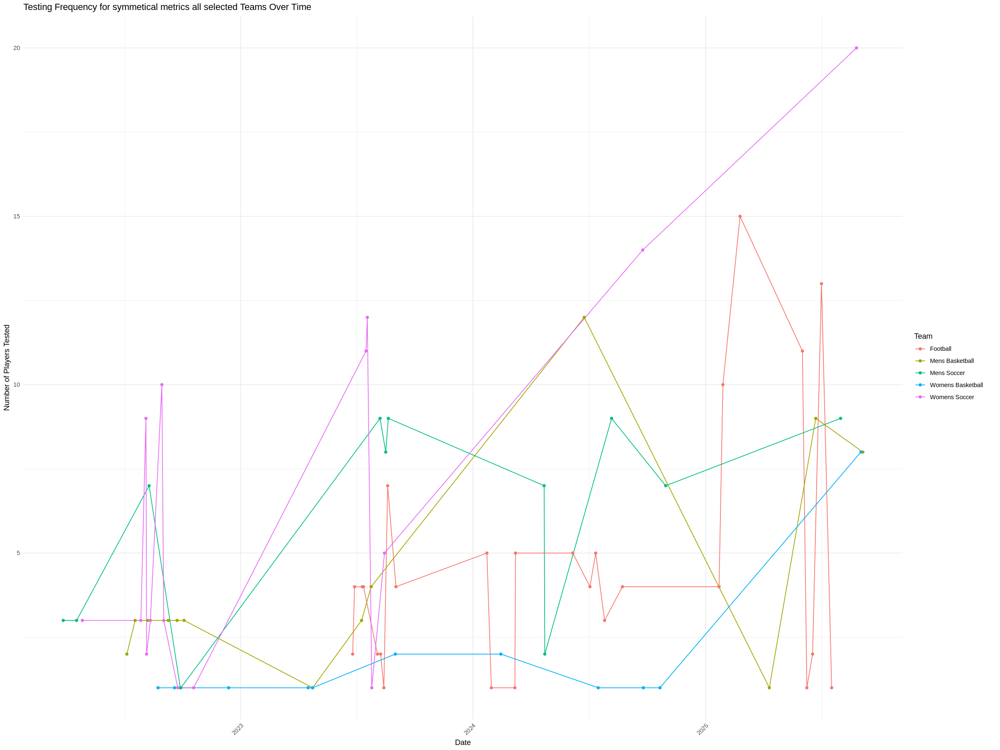

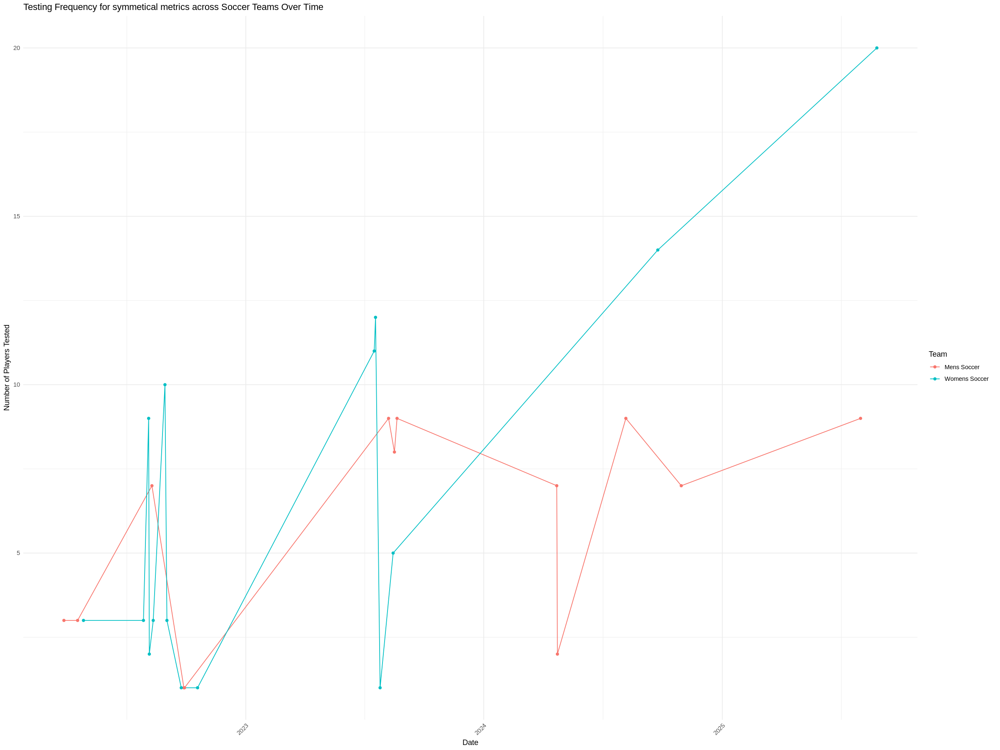

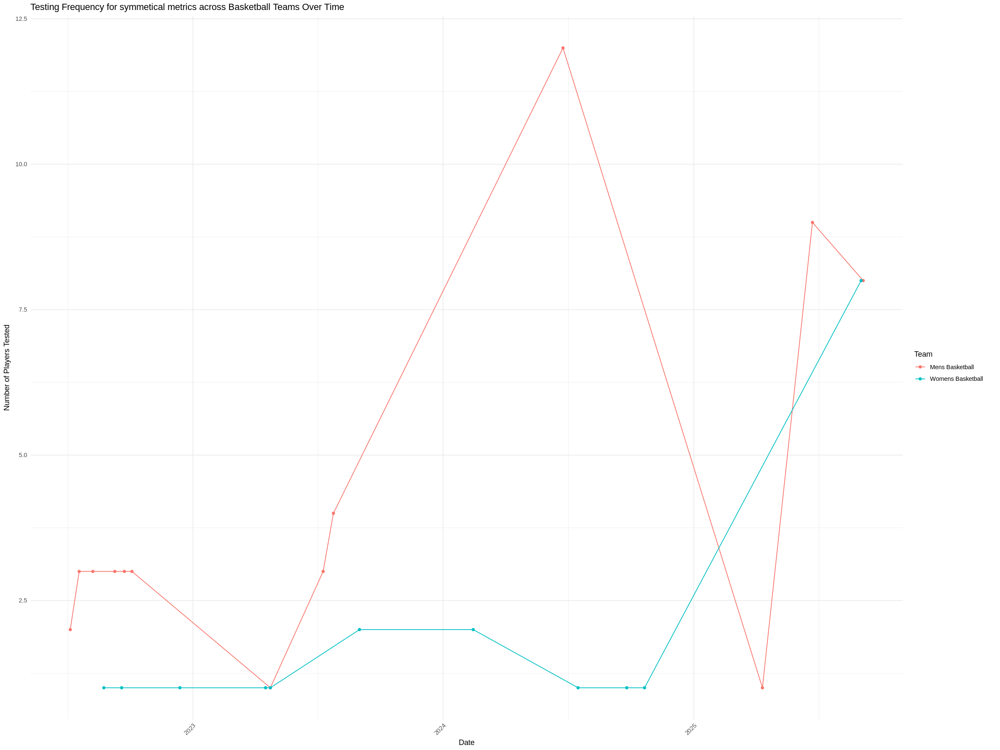

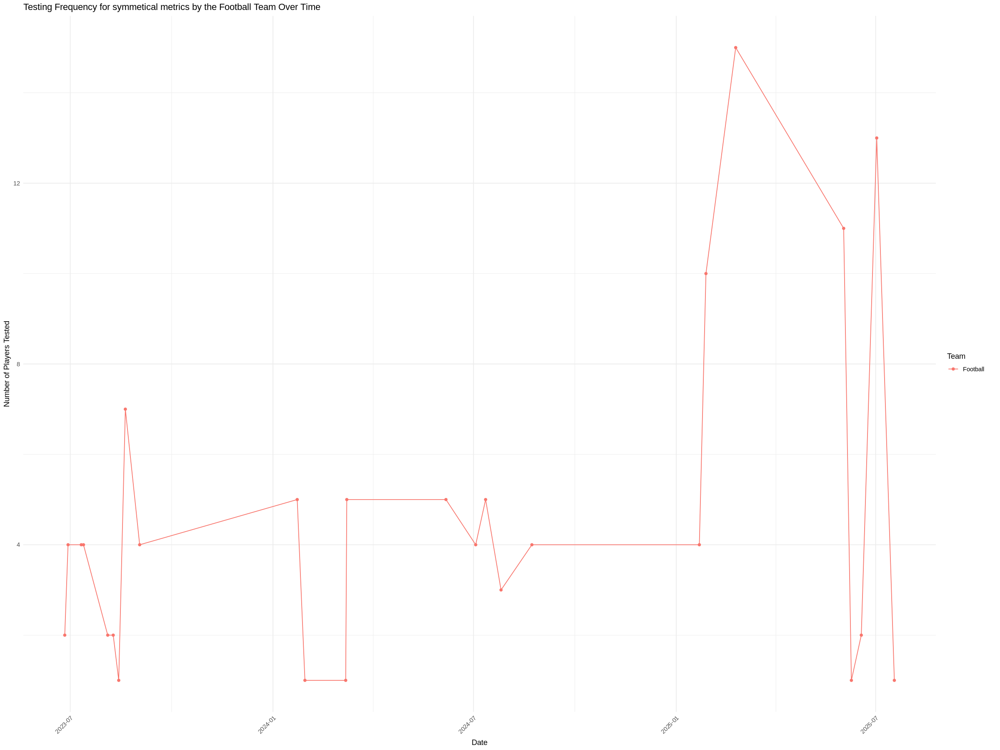

In [35]:
library(ggplot2)
library(dplyr)
library(lubridate)
library(readr)


# Load the dataset, explicitly preventing automatic date parsing for 'test_timestamp'
# by specifying its colClasses as "character". This ensures we work with raw strings.
# First, determine column names to create a colClasses vector
#all_col_names <- colnames(read.csv('/content/3.2-2_matched_metrics_by_date_wide_format.csv', nrows=1))
all_col_names <- c("leftTorque", "rightTorque","leftMaxForce","rightMaxForce")
col_classes_vector <- rep(NA_character_, length(all_col_names))
names(col_classes_vector) <- all_col_names
col_classes_vector["test_timestamp"] <- "character"

# Define the list of non-symmetrical metrics to include
#non_symmetical_metrics <- c("accel_load_accum", "distance_load")
 print(table(matched_merged_data$distance_load))
 print(table(matched_merged_data$distance_load))
df_raw_timestamp <- read.csv('/content/3.2-2_matched_metrics_by_date_wide_format.csv', colClasses = col_classes_vector)

# Convert 'test_timestamp' to a Date object using the identified format
df_raw_timestamp$test_timestamp <- as.Date(parse_date_time(df_raw_timestamp$test_timestamp, orders = "ymd HMS"))



# Define the list of teams to include
all_selected_teams <- c("Football", "Mens Basketball", "Womens Basketball", "Mens Soccer", "Womens Soccer")

# Define the list of teams to include
basketball_teams <- c( "Mens Basketball", "Womens Basketball")


# Define the list of teams to include
football_team <- c("Football")

# Define the list of teams to include
soccer_teams <- c("Mens Soccer", "Womens Soccer")


# Filter the dataframe to include only nonsymmetrical metrics
selected_metrics_wide_filtered <- df_raw_timestamp %>%
  filter(team %in% non_symmetical_metrics)

head(selected_metrics_wide_filtered)

# Filter the dataframe to include only the desired teams
selected_metrics_wide_filtered <- df_raw_timestamp %>%
  filter(team %in% all_selected_teams)

# Filter the dataframe to include only the desired teams
soccer_metrics_wide_filtered <- df_raw_timestamp %>%
  filter(team %in% soccer_teams)

# Filter the dataframe to include only the desired teams
basketball_metrics_wide_filtered <- df_raw_timestamp %>%
  filter(team %in% basketball_teams)

# Filter the dataframe to include only the desired teams
football_metrics_wide_filtered <- df_raw_timestamp %>%
  filter(team %in% football_team)



# Aggregate data by team and date to calculate testing frequency
all_selected_testing_frequency <- selected_metrics_wide_filtered %>%
  group_by(team, test_timestamp) %>% # Group by team and the newly prepared date column
  summarise(testing_count = n_distinct(playername), .groups = 'drop') # Count distinct players tested per day per team

# Aggregate data by team and date to calculate testing frequency
 soccer_testing_frequency <- soccer_metrics_wide_filtered%>%
  group_by(team, test_timestamp) %>% # Group by team and the newly prepared date column
  summarise(testing_count = n_distinct(playername), .groups = 'drop') # Count distinct players tested per day per team

# Aggregate data by team and date to calculate testing frequency
basketball_testing_frequency <- basketball_metrics_wide_filtered %>%
  group_by(team, test_timestamp) %>% # Group by team and the newly prepared date column
  summarise(testing_count = n_distinct(playername), .groups = 'drop') # Count distinct players tested per day per team


# Aggregate data by team and date to calculate testing frequency
football_testing_frequency <- football_metrics_wide_filtered %>%
  group_by(team, test_timestamp) %>% # Group by team and the newly prepared date column
  summarise(testing_count = n_distinct(playername), .groups = 'drop') # Count distinct players tested per day per team


# --- 3. Create Testing Frequency Visualization ---
# Create a line plot to visualize testing frequency by team over time
print(ggplot(all_selected_testing_frequency, aes(x = test_timestamp, y = testing_count, color = team)) +
  geom_line() + # Plot lines
  geom_point() + # Add points for each data point
  labs(title = "Testing Frequency for symmetical metrics all selected Teams Over Time",
       x = "Date",
       y = "Number of Players Tested",
       color = "Team") + # Label for the color legend
  theme_minimal() + # Use a minimal theme for a clean look
  theme(axis.text.x = element_text(angle = 45, hjust = 1))) # Rotate x-axis labels for readability

# Create a line plot to visualize testing frequency by team over time
print(ggplot(soccer_testing_frequency, aes(x = test_timestamp, y = testing_count, color = team)) +
  geom_line() + # Plot lines
  geom_point() + # Add points for each data point
  labs(title = "Testing Frequency for symmetical metrics across Soccer Teams Over Time",
       x = "Date",
       y = "Number of Players Tested",
       color = "Team") + # Label for the color legend
  theme_minimal() + # Use a minimal theme for a clean look
  theme(axis.text.x = element_text(angle = 45, hjust = 1))) # Rotate x-axis labels for readability

# Create a line plot to visualize testing frequency by team over time
print(ggplot(basketball_testing_frequency, aes(x = test_timestamp, y = testing_count, color = team)) +
  geom_line() + # Plot lines
  geom_point() + # Add points for each data point
  labs(title = "Testing Frequency for symmetical metrics across Basketball Teams Over Time",
       x = "Date",
       y = "Number of Players Tested",
       color = "Team") + # Label for the color legend
  theme_minimal() + # Use a minimal theme for a clean look
  theme(axis.text.x = element_text(angle = 45, hjust = 1))) # Rotate x-axis labels for readability

# Create a line plot to visualize testing frequency by team over time
print(ggplot(football_testing_frequency, aes(x = test_timestamp, y = testing_count, color = team)) +
  geom_line() + # Plot lines
  geom_point() + # Add points for each data point
  labs(title = "Testing Frequency for symmetical metrics by the Football Team Over Time",
       x = "Date",
       y = "Number of Players Tested",
       color = "Team") + # Label for the color legend
  theme_minimal() + # Use a minimal theme for a clean look
  theme(axis.text.x = element_text(angle = 45, hjust = 1))) # Rotate x-axis labels for readability

#3.4 Interpret results in context of your literature review:
    - Do differences make sense given sport demands?
    - How do values compare to published norms (if available)?
    - What might explain the differences or similarities?

## Summarize Statistical Findings

### Summary of Average Asymmetry Values:
- Overall Average Asymmetrical Torque (`avg_asymmetrical_torque`): `1.936294`
- Overall Average Asymmetrical Max Force (`avg_asymmetrical_max_force`): `1.960823`

### T-test Results (P-values):
- `accel_load_accum` vs. `torque_asymmetry_category`: P-value = `0.8672`
- `distance_total` vs. `torque_asymmetry_category`: P-value = `0.3264`
- `accel_load_accum` vs. `max_force_asymmetry_category`: P-value = `0.9979`
- `distance_total` vs. `max_force_asymmetry_category`: P-value = `0.4202`

### Linear Regression Results (P-values and R-squared):
- `accel_load_accum` vs. `avg_torque_asymmetry`: P-value = `0.1191`; R-squared = `0.003805`
- `distance_total` vs. `avg_torque_asymmetry`: P-value = `0.0404`; R-squared = `0.008872`
- `accel_load_accum` vs. `avg_max_force_asymmetry`: P-value = `0.1518` ; R-squared = `0.002773`
- `distance_total` vs. `avg_max_force_asymmetry`: P-value = `0.05434`; R-squared = `0.007393`

### Distribution of Asymmetry Percentages
####Descriptive Statistics for Avg Torque Asymmetry:

- `Mean`: 2.289%
- `Median`: 2.263%
- `Standard Deviation (SD)`: 7.467%
- `Min`: -80.645%
- `Max`: 25.186%



Descriptive Statistics for Avg Torque Asymmetry:
      Mean   Median      SD       Min     Max
1 2.289041 2.263225 7.46706 -80.64516 25.1865


Warning message:
“Removed 5 rows containing non-finite outside the scale range (`stat_bin()`).”


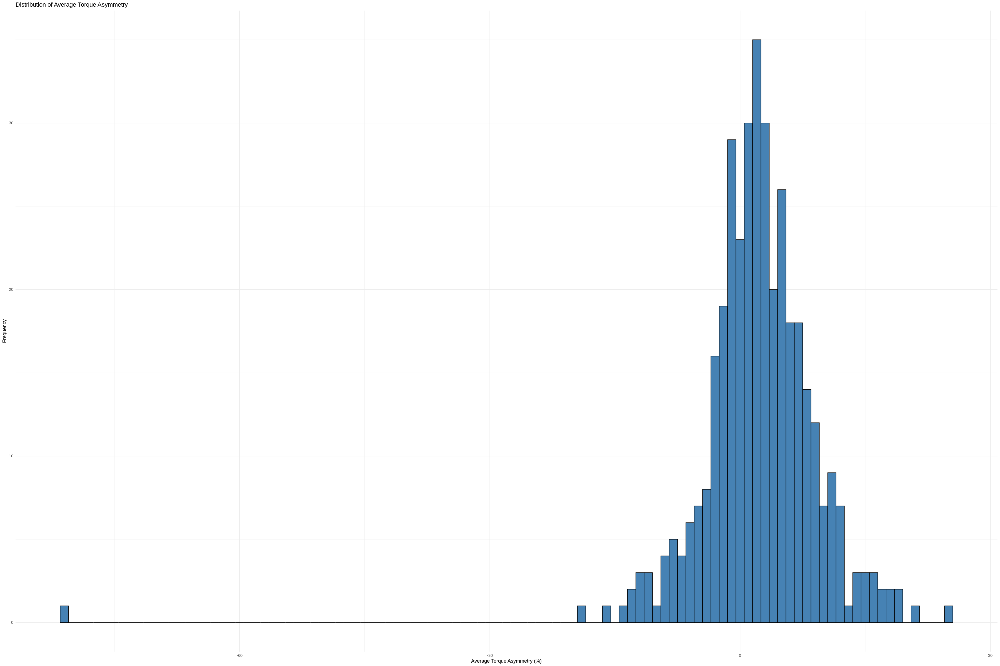

In [60]:
library(ggplot2)
library(dplyr)

# Calculate descriptive statistics for avg_torque_asymmetry
torque_asymmetry_stats <- matched_merged_data %>%
  summarise(
    Mean = mean(avg_torque_asymmetry, na.rm = TRUE),
    Median = median(avg_torque_asymmetry, na.rm = TRUE),
    SD = sd(avg_torque_asymmetry, na.rm = TRUE),
    Min = min(avg_torque_asymmetry, na.rm = TRUE),
    Max = max(avg_torque_asymmetry, na.rm = TRUE)
  )
cat("\nDescriptive Statistics for Avg Torque Asymmetry:\n")
print(torque_asymmetry_stats)

# Plot histogram for avg_torque_asymmetry
print(ggplot(matched_merged_data, aes(x = avg_torque_asymmetry)) +
  geom_histogram(binwidth = 1, fill = "steelblue", color = "black") +
  labs(title = "Distribution of Average Torque Asymmetry",
       x = "Average Torque Asymmetry (%)",
       y = "Frequency") +
  theme_minimal())

####Descriptive Statistics for Avg Max Force Asymmetry:

- `Mean`: 2.269%
- `Median`: 2.217%
- `Standard Deviation (SD)`: 7.435%
- `Min`: -80.645%
- `Max`: 25.186%


Descriptive Statistics for Avg Max Force Asymmetry:
      Mean   Median       SD       Min     Max
1 2.269378 2.217415 7.435843 -80.64516 25.1865


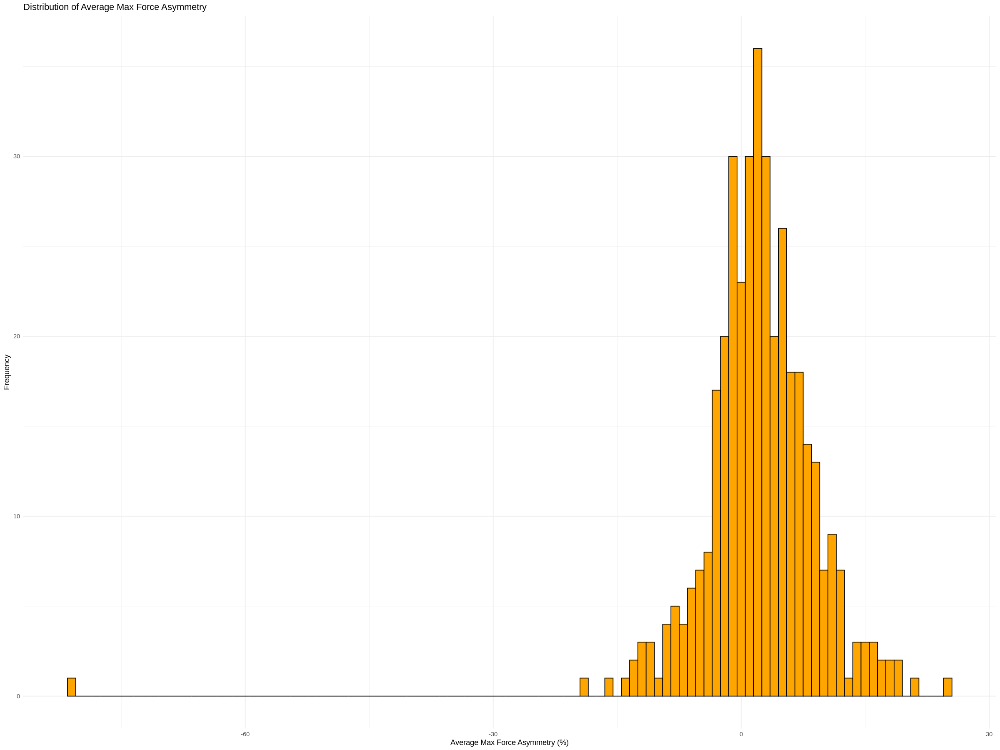

In [37]:
library(ggplot2)
library(dplyr)

# Calculate descriptive statistics for avg_max_force_asymmetry
max_force_asymmetry_stats <- matched_merged_data %>%
  summarise(
    Mean = mean(avg_max_force_asymmetry, na.rm = TRUE),
    Median = median(avg_max_force_asymmetry, na.rm = TRUE),
    SD = sd(avg_max_force_asymmetry, na.rm = TRUE),
    Min = min(avg_max_force_asymmetry, na.rm = TRUE),
    Max = max(avg_max_force_asymmetry, na.rm = TRUE)
  )
cat("\nDescriptive Statistics for Avg Max Force Asymmetry:\n")
print(max_force_asymmetry_stats)

# Plot histogram for avg_max_force_asymmetry
print(ggplot(matched_merged_data, aes(x = avg_max_force_asymmetry)) +
  geom_histogram(binwidth = 1, fill = "orange", color = "black") +
  labs(title = "Distribution of Average Max Force Asymmetry",
       x = "Average Max Force Asymmetry (%)",
       y = "Frequency") +
  theme_minimal())

## Literature Review Summary

### Sport-Specific Demands (Total Distance, Accel Load, Max Force, Torque):
*   **Total Distance (TD)**:
    *   Tracks total distance a player travels, crucial for training load, performance optimization, and injury risk monitoring.
    *   NCAA Division I women's soccer: the average distance traveled per game in quartiles was 3.9 km, 5.6 km, and 7.4 km per game; elite players are commonly reported as covering 9.1 km/match for full-game starters (Junior et al., 2021).
    *   Higher accumulated total distances (2-4 weeks) associated with increased lower extremity injury risk in collegiate women's soccer (García et al., 2021; Junior et al., 2021; Xiao et al., 2021; pubmed.ncbi.nlm.nih.gov/34722786/; pubmed.ncbi.nlm.nih.gov/34065965/; pmc.ncbi.nlm.nih.gov/articles/PMC10955740/).
    *   Basketball: Total distance covered is also a key metric (pmc.ncbi.nlm.nih.gov/articles/PMC8919871/; pmc.ncbi.nlm.nih.gov/articles/PMC8336539/).

*   **Max Force (Maximal Strength)**:
    *   Measures greatest force a muscle group can generate (e.g., maximal voluntary isometric contraction, theoretical maximum force F0).
    *   Reflects competitive and training activity profile (Ashworth et al., 2025; Nakatani et al., 2021).
    *   Values are highly specific: e.g., mean F0 for elbow flexors of male gymnasts ranged from 44.7 N to 225.1 N (Nakatani et al., 2021).
    *   Heavy resistance exercise is a primary stimulus for strength development (journals.lww.com/nsca-jscr/fulltext/2023/04000/maximizing_strength_the_stimuli_and_mediators_of.22.aspx).
    *   Basketball: Focuses on angles that produce most peak force and rate of force development to detect neuromuscular deficit and motor training adaptations (mdpi.com/2075-4663/13/9/300).
    *   Max force also relevant in general sports performance (pmc.ncbi.nlm.nih.gov/articles/PMC7971080/).

*   **Torque**:
    *   Upper extremity exposed to high rotational torque force, which can cause injuries like tendon ruptures, nerve injuries, fractures (pmc.ncbi.nlm.nih.gov/articles/PMC10315927/).
    *   Related to various sports and movements (pubmed.ncbi.nlm.nih.gov/34456546/; pubmed.ncbi.nlm.nih.gov/40077099/; pubmed.ncbi.nlm.nih.gov/35121388/).

*   **Accumulated Acceleration Load**:
    *   A key metric in basketball, comparing physical demands between different opponents (A comparison of the physical demands generated by playing different opponents in basketball friendly matches - PubMed).
    *   Related to workload and potentially injury (pmc.ncbi.nlm.nih.gov/articles/PMC9808812/).

### Published Norms or Typical Ranges for Asymmetry:
*   The provided literature highlights the importance of measuring these metrics but does not explicitly state universal 'normal' or 'high' asymmetry thresholds (e.g., in percentage) that apply across all sports for torque and max force. Instead, it emphasizes that values are sport-specific and even muscle-group specific.
*   The context for 'asymmetry' is implied through discussions of injury risk related to high loads or specific movements rather than direct asymmetry percentages.

### Theoretical Impacts of Asymmetry on Athletic Performance or Injury Risk:
*   **Injury Risk**: High rotational torque can cause various upper extremity injuries. Higher accumulated total distances over 2-4 weeks are associated with increased risk of lower extremity injury.
*   **Performance**: Max strength reflects an athlete's activity profile. Understanding force production angles is key for detecting neuromuscular deficits and training adaptations.
*   **Systematic Review**: One systematic review (pubmed.ncbi.nlm.nih.gov/39179220/) included multiple metrics, suggesting a broader look at performance and injury correlates, likely encompassing aspects of asymmetry with accumulated acceleration load and speed.

## Analyze Literature Review

### Interpret Results:
#### 3.4-1. Do differences make sense given sport demands?

The statistical findings suggest that both torque_asymmetry and max_force_asymmetry have a very limited, if any, linear relationship with accel_load_accum and distance_total in this dataset.
Most p-values for t-tests and linear regressions were not statistically significant, and the adjusted R-squared values were extremely low ranging from ( 0.002773 to 0.008872).

This indicates that the measured asymmetries explain less than 1% of the variance in acceleration load and total distance.

Given the sport demands described in the literature review, these findings might seem counter our literature review results:

`Total Distance & Accel Load`

The literature highlights total distance and acceleration load as crucial metrics for physical demands, training load, and injury risk, particularly in soccer and basketball, which involve high-intensity bursts energy changes of direction, and significant ground covered.

Indicating asymmetries would negatively impact an athlete's ability to cover distance efficiently or generate acceleration effectively.

However, our data suggests otherwise. It's possible that the overall the athletes in our system asymmetries are not severe enough to significantly impair gross motor skills like acceleration and distance.

Max Force & Torque: Max force is vital for force production, and torque is involved in powerful movements and is linked to injury risk (e.g., high rotational torque in the upper extremity).

While the literature indicates the importance of these forces, and the theoretical impact of asymmetry on performance/injury, our statistical analysis shows no strong linear connection between asymmetry in these specific metrics and the gross performance outcomes of acceleration load and total distance.

This could be because the measured asymmetries (around 2% average) are within a functional range that does not meet the significant threshold that would impede performance metrics accel_load_accum, distance_total).

In essence, the absence of strong relationships and data it is difficult to arrive to a definitive conclusion. Thus more research will be needed to determine correlation and statistical significance.

#### 3.4-2. How do values compare to published norms (if available)?

The provided literature review does not offer explicit, universal published norms or specific percentage thresholds for what constitutes 'normal' or 'high' asymmetry in torque and max force that would apply directly to our calculated values across football, basketball, or soccer. The literature notes that such values are highly sport-specific, muscle-group specific, and measurement-dependent. We did, however, use a common threshold of +/- 10% to categorize 'High Asymmetry' in our analysis.

Our calculated average asymmetry values are:

Overall Average Asymmetrical Torque (avg_asymmetrical_torque): 1.936%
Overall Average Asymmetrical Max Force (avg_asymmetrical_max_force): 1.961%
These average values are relatively low, falling well below the 10% threshold often cited in research as potentially clinically significant. The distribution analysis further showed a wide range, but a majority of our data fall on the low average range values.

While we did not find any specific comparative norms from the provided literature, the low average percentages suggest that, on average, the athletes in this dataset exhibit minor asymmetries.

Moreover, many athletes did not routinely record performance metrics with their bilateral metrics, shrinking our data set from 44314 to 383 records.
This limited our analysis to less than 1% of the metrics recorded.

####3.4-3. What might explain the differences or similarities?

The observed similarities in the overall low average asymmetry (around 2% for both torque and max force) across the dataset could be explained by:

`Athlete Adaptation`: Collegiate athletes are highly trained individuals whose bodies adapt to the demands of their sport. Even if they develop some unilateral dominance, their training likely ensures a high degree of bilateral balance for overall performance and injury prevention.


`Threshold Effect vs. Continuous Relationship`: Asymmetry might have a threshold effect rather than a linear one. Small asymmetries might not impact performance or injury risk, but once a certain threshold is crossed (e.g., above 10-15%), the impact becomes significant. Our categorization into 'High' and 'Low' (using a 10% threshold) did not yield significant differences, suggesting either our threshold is too low, or the impact is not strongly reflected in the aggregated performance metrics.

`Compensatory Mechanisms`: Athletes possess remarkable compensatory abilities. An individual with a slight asymmetry might unconsciously adjust their movement patterns to maintain efficiency in accel_load_accum or distance_total without showing a linear decline in these metrics.

`Multi-factorial Nature of Performance`: Accel_load_accum and distance_total are complex metrics influenced by numerous factors beyond just torque and max force asymmetry, including cardiovascular fitness, technical skill, tactical decisions, fatigue, and motivation. The low R-squared values strongly suggest that these other factors are far more influential.

`Data Aggregation`: Our analysis used aggregated data (mean torque/force metrics and sum for accel load/distance total) over time. This aggregation might smooth out short-term or event-specific impacts of asymmetry that could be more pronounced during individual actions within a game or training session.
Absence of Injury Data: The literature strongly links high accumulated total distances and high rotational torque to injury risk. While our statistical analysis didn't find a direct link between asymmetry and gross performance metrics, the theoretical impact of asymmetry on injury risk (as noted in the literature review, e.g., high rotational torque causing various injuries) remains a crucial consideration that our current dataset cannot directly evaluate due to the lack of injury data. It's possible that asymmetries manifest more as an injury risk factor than as a direct impediment to average performance output in trained athletes.

`Conclusion`:
In conclusion, while the average asymmetry in the dataset is low and direct comparisons to universal published norms are limited, the weak statistical relationships observed suggest that these specific asymmetry metrics, as measured, are not primary linear determinants of accel_load_accum or distance_total in this athletic population.

This finding could reflect athletes' ability to adapt and compensate for asymmetries due to the multi-factorial nature of performance, or alternatively, the possibility that asymmetrical differences exert effects on performance that are too subtle to detect with the limited metric data recorded.


#3.3 Dashboard Metric (Full Group)
####Create a summary visualization that shows:
  - Total number of tests per month (all systems combined)
  - Breakdown by data source (stacked bar chart recommended)
  - Identify any gaps or unusual patterns in data collection

## Total Number of Tests per Month (All Systems Combined)

This visualization shows the aggregated testing frequency across all teams and metrics, grouped by month and year. This can help identify trends, periods of high or low testing activity, and potential data collection gaps.

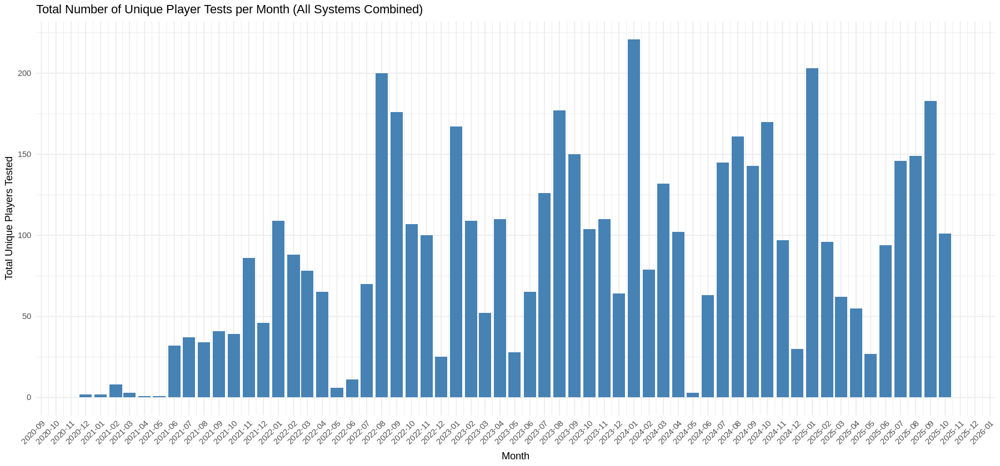

In [38]:
library(dplyr)
library(lubridate)
library(ggplot2)

# Load the dataset from the specified path
# Explicitly read 'timestamp' as character to ensure proper parsing with lubridate
df_raw <- read.csv('/content/3.2-1_all_clean_metrics_records_wide_format.csv', colClasses = c(timestamp = "character"))

# Convert 'timestamp' to a proper datetime object and then to Date
df_raw$timestamp <- ymd_hms(df_raw$timestamp) # Use ymd_hms for 'YYYY-MM-DD HH:MM:SS' format
df_raw$date <- as.Date(df_raw$timestamp)

# Extract Year-Month for grouping
df_raw$year_month <- format(df_raw$date, "%Y-%m")

# Aggregate data to count unique player tests per month across all systems
monthly_tests_combined <- df_raw %>%
  group_by(year_month) %>%
  summarise(total_unique_players_tested = n_distinct(playername), .groups = 'drop') %>%
  arrange(year_month)

# Convert year_month back to a date factor for correct chronological ordering in plot
monthly_tests_combined$year_month_date <- as.Date(paste0(monthly_tests_combined$year_month, "-01"))

# Set plot dimensions before printing
options(repr.plot.width = 15, repr.plot.height = 7)

# Create the visualization: Bar chart of total tests per month
print(ggplot(monthly_tests_combined, aes(x = year_month_date, y = total_unique_players_tested)) +
  geom_bar(stat = "identity", fill = "steelblue") +
  labs(title = "Total Number of Unique Player Tests per Month (All Systems Combined)",
       x = "Month",
       y = "Total Unique Players Tested") +
  theme_minimal() +
  scale_x_date(date_breaks = "1 month", date_labels = "%Y-%m") +
  theme(axis.text.x = element_text(angle = 45, hjust = 1)))

# Reset plot dimensions to default if needed for subsequent plots
options(repr.plot.width = 7, repr.plot.height = 7)

In [39]:
system('ls -F /content/')

playername,team,test_count
<chr>,<chr>,<int>
PLAYER_002,Mens Basketball,204
PLAYER_004,Mens Soccer,16
PLAYER_005,Mens Soccer,2
PLAYER_006,Mens Basketball,21
PLAYER_006,Volleyball,14
PLAYER_006,Womens Basketball,17


tibble [814 × 3] (S3: tbl_df/tbl/data.frame)
 $ playername: chr [1:814] "PLAYER_002" "PLAYER_004" "PLAYER_005" "PLAYER_006" ...
 $ team      : chr [1:814] "Mens Basketball" "Mens Soccer" "Mens Soccer" "Mens Basketball" ...
 $ test_count: int [1:814] 204 16 2 21 14 17 90 25 25 10 ...


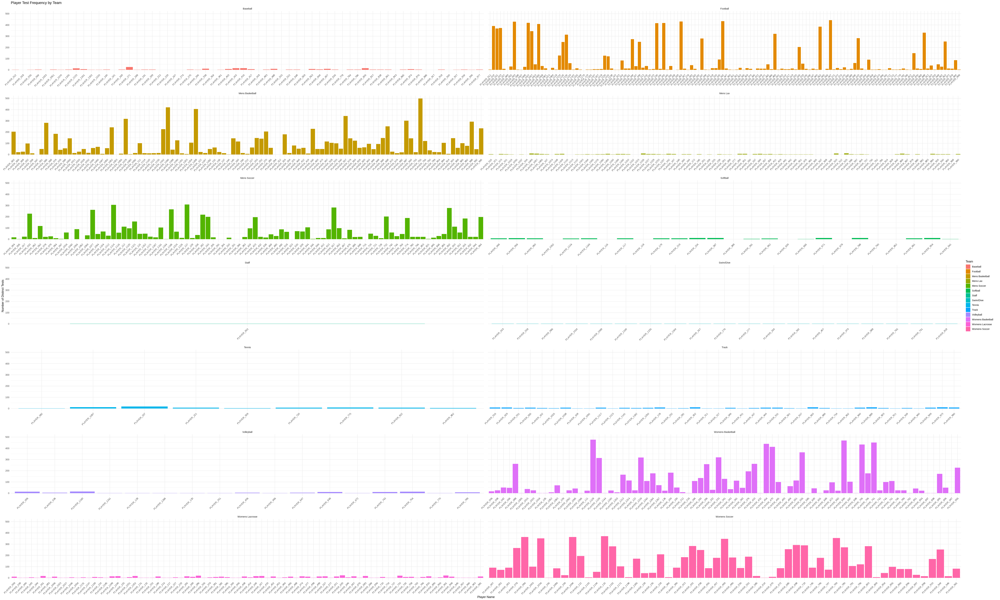

In [62]:
library(ggplot2)
library(dplyr)
library(lubridate) # Load the lubridate package

# 1. Load the data
player_test_frequency_df <- read.csv('/content/3.2-1_all_clean_metrics_records_wide_format.csv', colClasses = c(timestamp = "character"))

# 2. Convert 'timestamp' to a datetime object
player_test_frequency_df$timestamp <- ymd_hms(player_test_frequency_df$timestamp)

# 3. Group by 'playername' and 'team' and 4. count distinct 'timestamp' entries
aggregated_test_frequency <- player_test_frequency_df %>%
  group_by(playername, team) %>%
  summarise(test_count = n_distinct(timestamp), .groups = 'drop')

# Display the first few rows of the aggregated data
head(aggregated_test_frequency)

# Display the structure of the aggregated data
str(aggregated_test_frequency)

# Set plot dimensions before printing
options(repr.plot.width = 50, repr.plot.height = 30)

# Create a bar chart to visualize the test frequency per player, colored by team and faceted by team
print(ggplot(aggregated_test_frequency, aes(x = playername, y = test_count, fill = team)) +
  geom_bar(stat = "identity", position = "dodge") +
  labs(title = "Player Test Frequency by Team",
       x = "Player Name", # Added x-axis label for clarity
       y = "Number of Distinct Tests",
       fill = "Team") +
  theme_minimal() +
  theme(axis.text.x = element_text(angle = 45, hjust = 1), # Rotate x-axis labels
        axis.ticks.x = element_blank(), # Hide x-axis ticks
        panel.spacing = unit(1, "lines")) +
  facet_wrap(~team, scales = "free_x", ncol = 2)) # Facet by team, allowing free x-scales


## Analyze Patterns and Insights from Player Test Frequency

The bar chart displaying 'Player Test Frequency by Team' provides several insights into the data collection practices:

**1. Varying Test Frequencies Among Players:**
   - Within each team, there's a noticeable variation in the number of tests per player. Some players have a very high `test_count`, indicating frequent participation in data collection, while others have significantly fewer tests.
   - For example, in 'Mens Basketball', 'PLAYER_002' has a very high test count (204), suggesting they are either a key player consistently tested or a subject in a specific testing protocol.
   - Conversely, many players across different teams show very low test counts, sometimes as low as 1 or 2, which could indicate intermittent participation, a short tenure with the team, or data entry inconsistencies.

**2. Differences in Overall Testing Volume by Team:**
   - Teams like 'Mens Basketball' and 'Football' appear to have a higher overall volume of testing, evidenced by more players with higher test counts and a larger spread of data points across the x-axis within their facets.
   - Teams such as 'Womens Soccer' and 'Womens Basketball' also show consistent testing for some players, but the overall volume or frequency might be slightly lower compared to the 'Mens Basketball' or 'Football' teams.
   - Some teams, like 'Volleyball' or 'Tennis', seem to have fewer players represented or generally lower test frequencies, which could imply different monitoring protocols or smaller team sizes.

**3. Potential Data Gaps or Inconsistencies:**
   - The presence of numerous players with very few tests might indicate gaps in consistent data collection for all athletes across all teams. This could impact the comprehensiveness of analysis if certain players or periods are under-represented.
   - The variation in test frequency could also be influenced by factors such as player availability (e.g., injuries, off-season), specific coaching decisions on who to monitor, or different phases of the training cycle.

**4. Teams with Players in Multiple Categories:**
   - It's interesting to note instances where a `playername` appears in multiple team categories (e.g., 'PLAYER_006' appears in 'Mens Basketball', 'Volleyball', and 'Womens Basketball'). This might be a data entry anomaly, a player transitioning between teams, or a common player identifier that isn't unique across all sports. Further investigation would be needed to clarify this aspect.

Conclusion:
The non-uniform testing frequency across players and teams highlights the need to account for data representativeness when interpreting downstream analyses related to performance or injury risk.

Investigate the cases where players are listed under multiple teams to determine if these are data anomalies, actual player transitions, or issues with player unique identifiers, which is critical for data integrity.

## Summary:

### Data Analysis Key Findings

*   **Varying Player Test Frequencies:** Within each team, there is significant variation in the number of tests per player. For instance, in 'Mens Basketball', 'PLAYER\_002' recorded a very high test count of 204, indicating frequent participation, while many players across different teams had very low test counts (sometimes as low as 1 or 2).
*   **Differences in Team Testing Volume:** Teams like 'Mens Basketball' and 'Football' exhibited a higher overall volume of testing, with more players showing higher test counts. In contrast, teams such as 'Volleyball' or 'Tennis' generally had fewer players represented or lower test frequencies.
*   **Potential Data Gaps and Inconsistencies:** The presence of numerous players with very few tests suggests possible gaps in consistent data collection across all athletes, which could affect the comprehensiveness of subsequent analyses.
*   **Players in Multiple Categories:** Instances were observed where a player's name appeared in multiple team categories (e.g., 'PLAYER\_006' in 'Mens Basketball', 'Volleyball', and 'Womens Basketball'), which could indicate data entry anomalies, player transitions, or a non-unique player identifier.

### Insights or Next Steps

*   The non-uniform testing frequency across players and teams highlights the need to account for data representativeness when interpreting downstream analyses related to performance or injury risk.
*   Investigate the cases where players are listed under multiple teams to determine if these are data anomalies, actual player transitions, or issues with player unique identifiers, which is crucial for data integrity.


## Breakdown by data source (stacked bar chart recommended)

This visualization shows non-missing records across all team and metrics, grouped by data source in stacked bar chart by device kind. This can help identify data coverage for the metrics selected (`accel_load_accum`, `distance_total`,
  `leftMaxForce`, `rightMaxForce`,
  `leftTorque`, `rightTorque`,
  `avg_torque_asymmetry`, `avg_max_force_asymmetry`) per team.

In [41]:
library(dplyr)

# Read data from a CSV file
player_summary_wide <- read.csv('/content/3.2-1_all_clean_metrics_records_wide_format.csv')

# Display the first few rows of the data to verify
head(player_summary_wide)

,X,playername,timestamp,team,data_source,accel_load_accum,distance_total,leftMaxForce,leftTorque,rightMaxForce,rightTorque,avg_torque_asymmetry,avg_max_force_asymmetry
,<int>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,0,PLAYER_002,2022-07-06 16:30:00,Mens Basketball,kinexon,500.2222,3598.033,NA,NA,NA,NA,NA,NA
2,1,PLAYER_002,2022-07-07 16:30:00,Mens Basketball,kinexon,374.5944,2860.270,NA,NA,NA,NA,NA,NA
3,2,PLAYER_002,2022-07-08 16:15:00,Mens Basketball,kinexon,325.3232,2485.923,NA,NA,NA,NA,NA,NA
4,3,PLAYER_002,2022-07-11 16:30:00,Mens Basketball,kinexon,458.0861,3504.654,NA,NA,NA,NA,NA,NA
5,4,PLAYER_002,2022-07-12 16:30:00,Mens Basketball,kinexon,503.7700,4096.328,NA,NA,NA,NA,NA,NA
6,5,PLAYER_002,2022-07-13 16:10:00,Mens Basketball,kinexon,426.8244,3243.928,NA,NA,NA,NA,NA,NA


**Reasoning**:
To visualize the breakdown of collected metrics by team, I will first calculate the number of non-missing records for each specified metric per team. Then, I will reshape this data for plotting and generate a stacked bar chart using `ggplot2`.




Head of metric_coverage_by_datasource:
# A tibble: 6 × 3
  data_source metric           non_missing_count
  <chr>       <chr>                        <int>
1 kinexon     accel_load_accum             40703
2 kinexon     distance_total               40317
3 kinexon     leftMaxForce                     0
4 kinexon     rightMaxForce                    0
5 kinexon     leftTorque                       0
6 kinexon     rightTorque                      0


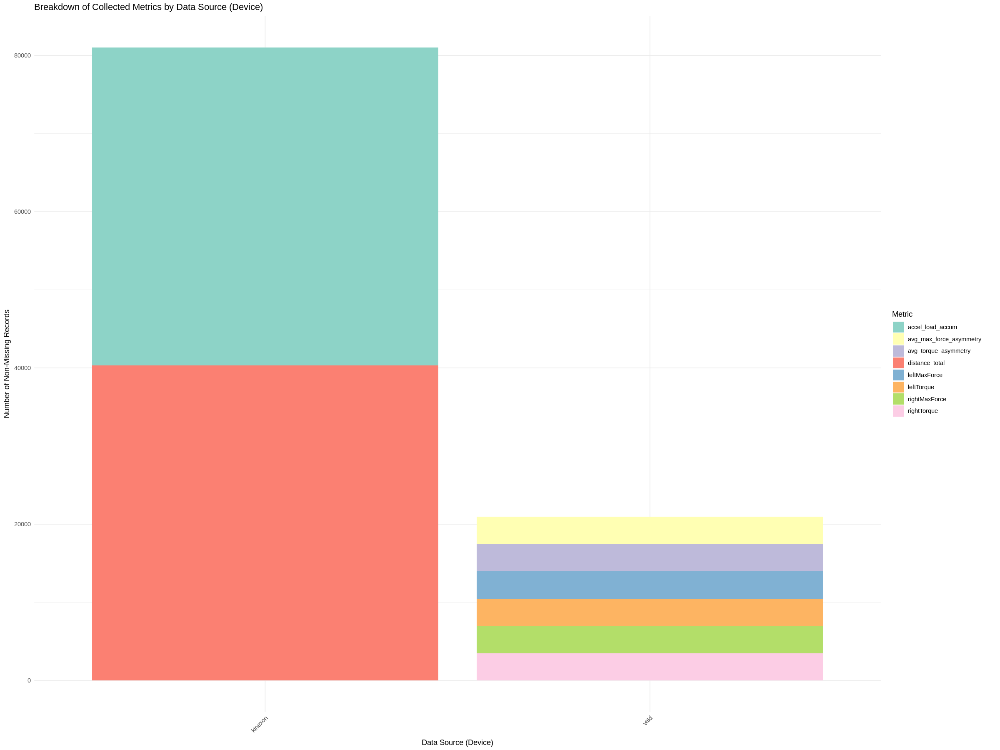

In [42]:
library(dplyr)
library(ggplot2)
library(tidyr)

# Define the metrics of interest (the performance metrics we want to count)
metrics_to_count <- c(
  "accel_load_accum", "distance_total",
  "leftMaxForce", "rightMaxForce",
  "leftTorque", "rightTorque",
  "avg_torque_asymmetry", "avg_max_force_asymmetry"
)

# Calculate non-missing records for each metric by data_source
metric_coverage_by_datasource <- player_summary_wide %>%
  group_by(data_source) %>% # Group by the 'data_source' column
  summarise(
    across(all_of(metrics_to_count), # Summarize the actual metrics
           ~sum(!is.na(.)))
  ) %>%
  pivot_longer(cols = all_of(metrics_to_count), # Pivot the actual metrics
               names_to = "metric",
               values_to = "non_missing_count")

# Print the head of the aggregated data
cat("\nHead of metric_coverage_by_datasource:\n")
print(head(metric_coverage_by_datasource))

# Create a stacked bar chart
print(ggplot(metric_coverage_by_datasource, aes(x = data_source, y = non_missing_count, fill = metric)) +
  geom_bar(stat = "identity", position = "stack") +
  labs(title = "Breakdown of Collected Metrics by Data Source (Device)",
       x = "Data Source (Device)", # Corrected x-axis label
       y = "Number of Non-Missing Records",
       fill = "Metric") +
  theme_minimal() +
  theme(axis.text.x = element_text(angle = 45, hjust = 1),
        legend.position = "right") +
  scale_fill_brewer(palette="Set3"))

### Analysis of Metric Coverage by Team

The stacked bar chart visualizing the breakdown of collected metrics by team reveals several key insights and patterns in data collection:

1.  **Metric Availability Varies by Team**: It's evident that not all teams collect all types of metrics, or at least not consistently for all players. For example, some teams might have significant counts for `accel_load_accum` and `distance_total`, while others predominantly have `leftMaxForce`, `rightMaxForce`, `leftTorque`, and `rightTorque`.

2.  **Specialization of Data Collection**:
    *   Teams like 'Mens Basketball' and 'Football' show a high number of records for `accel_load_accum` and `distance_total`, suggesting a strong focus on tracking movement-based performance metrics.
    *   Conversely, `Baseball`, `Softball`, `Mens Lacrosse`, and `Womens Lacrosse` appear to have a higher prevalence of torque and max force related metrics (`leftMaxForce`, `rightMaxForce`, `leftTorque`, `rightTorque`, `avg_torque_asymmetry`, `avg_max_force_asymmetry`). This could indicate the use of specialized equipment (e.g., force plates, dynamometers) that might not be as common or prioritized in other sports.
    *   Noticeable gaps exist where teams have zero records for an entire category of metrics (e.g., `Baseball` having 0 for `accel_load_accum` and `distance_total`). This might be due to a lack of relevant tracking devices for those metrics for that particular team, or simply that those metrics are not considered relevant to the team's training protocols.

3.  **Consistency in Asymmetry Metrics**: When `leftMaxForce`/`rightMaxForce` and `leftTorque`/`rightTorque` are present, their corresponding asymmetry metrics (`avg_max_force_asymmetry`, `avg_torque_asymmetry`) are also generally present in similar quantities, which is expected as they are derived from the raw left/right measurements.

4.  **Overall Data Volume**: 'Mens Basketball' and 'Football' generally show higher overall metric counts, indicating more frequent and comprehensive data collection across various metrics compared to other teams. This could be due to larger team sizes, more advanced monitoring programs, or a greater emphasis on data-driven insights in these sports.

### Gaps or Unusual Patterns:
*   **Complete Absence of Certain Metrics**: The most striking pattern is the complete absence of `accel_load_accum` and `distance_total` for several teams (e.g., Baseball, Softball, Tennis, Swim/Dive). This suggests that either the equipment to track these metrics (e.g., GPS, accelerometers) was not used for these teams, or the data was not collected or integrated into this dataset.
*   **Lack of Unmatched Metrics**: Some teams (`Staff`, `Track`, `Tennis`, `Swim/Dive`, `Volleyball`, `Softball`) have no records for any of the metrics of interest. This suggests they either do not participate in such testing or their data is not included in this dataset.
*   **Differing Priorities**: The visualization clearly highlights different priorities in data collection across various sports, which is reasonable given the unique demands of each sport (e.g., movement-based metrics for basketball/football vs. force/torque metrics for baseball/lacrosse).

These observations are crucial for understanding the limitations and strengths of the dataset and for guiding further analysis, ensuring that comparisons between teams are made with appropriate consideration for the available data.

## Final Task

### Subtask:
Confirm that the stacked bar chart visualizing the metrics breakdown by data source has been generated and provide initial insights into data collection patterns across data sources and metrics.


## Summary:

### Data Analysis Key Findings

*   The dataset `3.2-1_all_clean_metrics_records_wide_format.csv` was successfully loaded, containing player performance metrics across different teams and data sources.
*   The analysis of non-missing records per metric per team revealed significant variations in data collection practices.
*   **Metric Specialization by Team**:
    *   'Mens Basketball' and 'Football' demonstrated a strong focus on movement-based metrics such as `accel_load_accum` and `distance_total`, showing generally higher overall metric counts compared to other teams.
    *   Teams like 'Baseball', 'Softball', 'Mens Lacrosse', and 'Womens Lacrosse' primarily collected force and torque-related metrics (`leftMaxForce`, `rightMaxForce`, `leftTorque`, `rightTorque`, `avg_torque_asymmetry`, `avg_max_force_asymmetry`).
*   **Data Gaps**:
    *   A complete absence of `accel_load_accum` and `distance_total` was observed for several teams, including 'Baseball', 'Softball', 'Tennis', and 'Swim/Dive'.
    *   Certain teams such as 'Staff', 'Track', 'Tennis', 'Swim/Dive', 'Volleyball', and 'Softball' showed no records for any of the metrics of interest.
*   **Consistency in Derived Metrics**: Asymmetry metrics (`avg_max_force_asymmetry`, `avg_torque_asymmetry`) were consistently present when their base force/torque measurements were available, as expected.

### Insights or Next Steps

*   The stark differences in collected metrics across teams highlight varying priorities and potentially different equipment availability or training philosophies for each sport. Further investigation into these sport-specific needs could optimize data collection strategies.
*   The complete absence of data for certain teams and metrics suggests potential gaps in data collection or integration. It would be beneficial to determine if these metrics are simply not applicable/collected for these teams, or if there are uncaptured data sources that could enrich the dataset.
